In [1]:
!pip install mne

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 60.4 MB/s eta 0:00:00


In [2]:
!pip install autoreject

In [3]:
import scipy.io as spio
import pandas as pd
import numpy as np
import os
import json
import matplotlib.pyplot as plt
import mne
from mne.io import RawArray
from mne import create_info
from mne.channels import make_standard_montage

path_data = 'MyDrive/Colab Notebooks/data/DataMiningProject/'
path_mount = '/content/drive/'

In [4]:
from google.colab import drive
drive.mount(path_mount)

Mounted at /content/drive/


In [5]:
subjects = ["S1", "S2", "S3", "S4", "S5"]
unicorn_channels = ["Fz", "C3", "Cz", "C4", "Pz", "PO7", "Oz", "PO8"]

# **ICA per paziente S1**

In [6]:
subject = "S1"
file_path = os.path.join(path_mount, path_data, subject)
df = pd.read_json(file_path + ".json")

trigger = np.array(df.trigger)

eeg = df[unicorn_channels].to_numpy()
chs = unicorn_channels
fs = df['sampling_rate'].values[0]

df[df['trigger'] == 1]
df.head()

,Fz,C3,Cz,C4,Pz,PO7,Oz,PO8,trigger,sampling_rate
0,11.564022,6.806195,-0.839958,9.335871,5.796990,36.272963,5.265542,4.032394,0,250
1,11.496354,4.750291,0.263784,9.484304,5.252266,33.884664,4.147289,3.818456,0,250
2,11.021716,1.988979,1.273208,9.215325,4.437914,30.810695,3.426729,3.917395,0,250
3,10.592941,-1.048433,1.788976,8.848998,3.339090,27.122807,2.947671,4.145565,0,250
4,10.075521,-4.130195,1.296407,8.589282,1.947523,22.976416,2.374365,4.096638,0,250


Creating RawArray with float64 data, n_channels=8, n_times=60871
    Range : 0 ... 60870 =      0.000 ...   243.480 secs
Ready.
60871
[ 1254  1299  1342 ... 59446 59489 59534] 1200 [-1 -1 -1 ... -1 -1 -1] 1200
Ones [1. 1. 1. ... 1. 1. 1.] 1050
Threes [3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3.] 150
stim_data =  [[0. 0. 0. ... 0. 0. 0.]]
Creating RawArray with float64 data, n_channels=1, n_times=60871
    Range : 0 ... 60870 =      0.000 ...   243.480 secs
Ready.
stim_raw =  <RawArray | 1 x 60871 (243.5 s), ~482 kB, data loaded>
Using matplotlib as 2D backend.


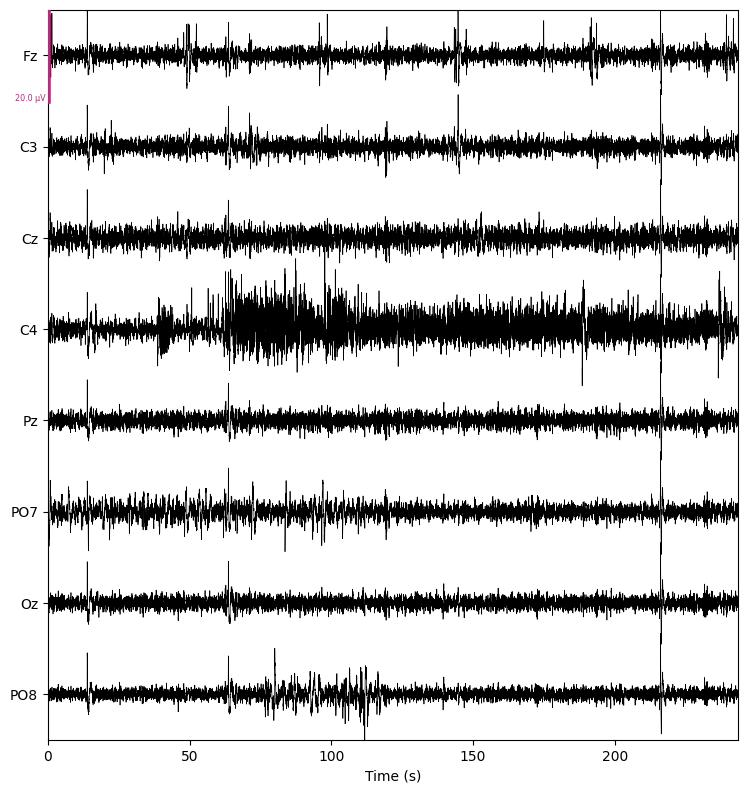

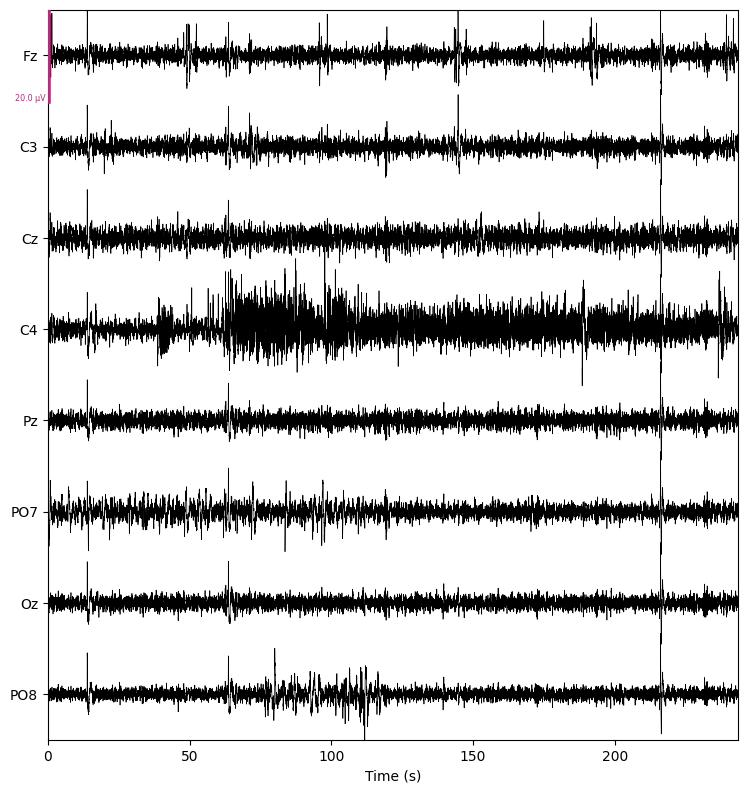

In [7]:
thisRec = RawArray(eeg.T/1e7, create_info(chs, fs, ch_types='eeg'))

# Get event indexes where value is not 0, i.e. -1 or 1
pos = np.where(trigger != 0)[0]

print(len(trigger))
# Filter 0 values from the trigger array
y = trigger[trigger != 0]
print(pos, len(pos), y, len(y))

# Create the stimuli channel
stim_data = np.zeros((1, thisRec.n_times))

# MNE works with absolute values of labels so -1 and +1 would result in only one kind of event
# that's why we add 2 and obtain 1 and 3 as label values
stim_data[0,pos] = y + 2
ones = stim_data[stim_data == 1]
threes = stim_data[stim_data == 3]
print("Ones", ones, len(ones))
print("Threes", threes, len(threes))
print('stim_data = ', stim_data)
stim_raw = RawArray(stim_data, create_info(['STI'], thisRec.info['sfreq'], ch_types=['stim']))
print('stim_raw = ', stim_raw)
# adding the stimuli channel (as a Raw object) to our EEG Raw object
thisRec.add_channels([stim_raw])

# Set the standard 10-20 montage
montage = make_standard_montage('standard_1020')
thisRec.set_montage(montage)

thisRec.plot(n_channels = len(unicorn_channels), show_scrollbars = False, duration = 400, scalings = 10e-6)

**Fittiamo ICA su tutto il segnale raw filtrato, e con epoche di 1s**

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 825 samples (3.300 s)

Not setting metadata
243 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 243 events and 251 original time points ...
0 bad epochs dropped


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


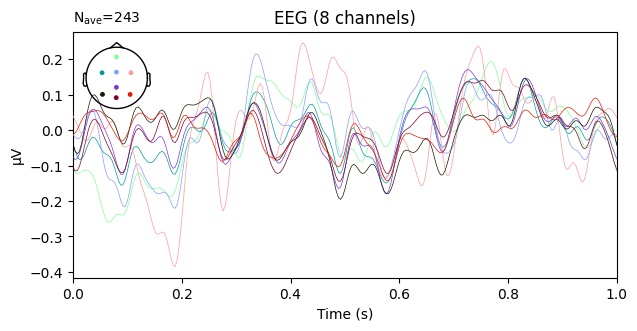

In [8]:
# Preprocessing with ICA

ica_low_cut = 1.0
hi_cut  = 30

filt_raw = thisRec.copy().filter(l_freq = ica_low_cut, h_freq = hi_cut)

t_a = 0
t_b = 1

d = t_b - t_a

events_ica = mne.make_fixed_length_events(filt_raw, duration = d)
epochs_ica = mne.Epochs(filt_raw, events_ica, tmin = t_a, tmax = t_b, baseline = None, preload = True)


epochs_ica.average().plot(spatial_colors = True);

In [9]:
from autoreject import get_rejection_threshold

reject = get_rejection_threshold(epochs_ica)
epochs_ica = epochs_ica.drop_bad(reject)
reject

Estimating rejection dictionary for eeg
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Cz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4', 'PO7']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Re

{'eeg': 1.3162402144910183e-05}

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Selecting by explained variance: 7 components


<ipython-input-10-a7f86c201b7e>:4: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject = reject, tstep = d)


Fitting ICA took 2.4s.
Creating RawArray with float64 data, n_channels=7, n_times=60871
    Range : 0 ... 60870 =      0.000 ...   243.480 secs
Ready.


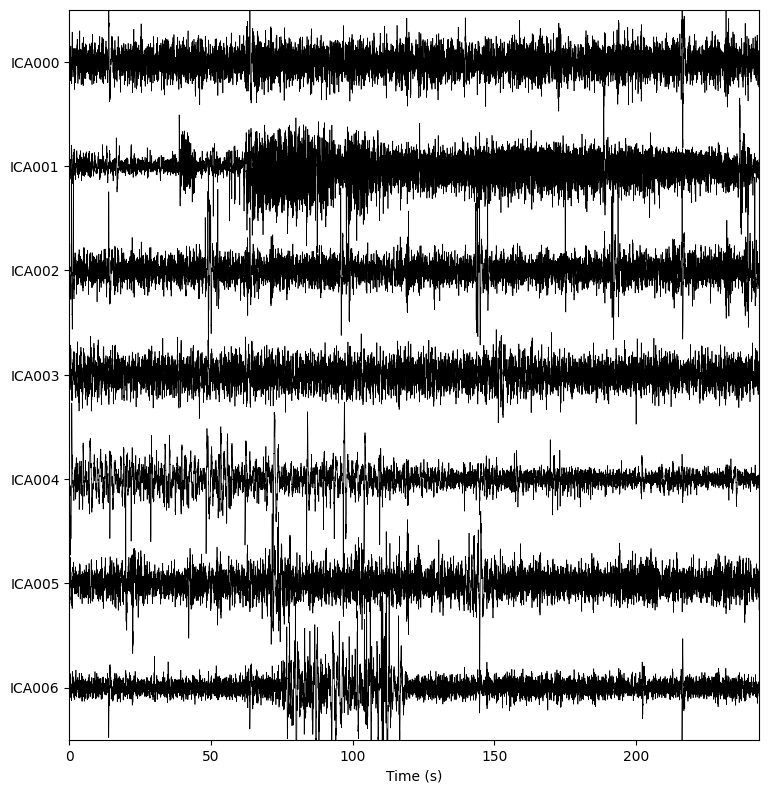

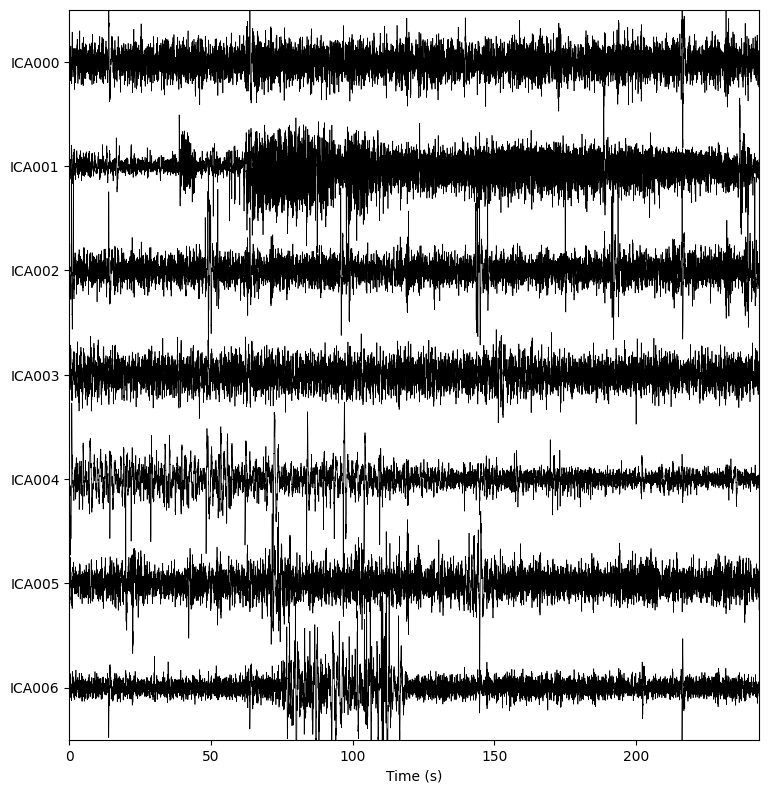

In [10]:
n_components = 0.99

ica = mne.preprocessing.ICA(n_components = n_components, max_iter = 'auto', random_state = 0)
ica.fit(epochs_ica, reject = reject, tstep = d)
ica.plot_sources(filt_raw, show_scrollbars = False, stop = 400)

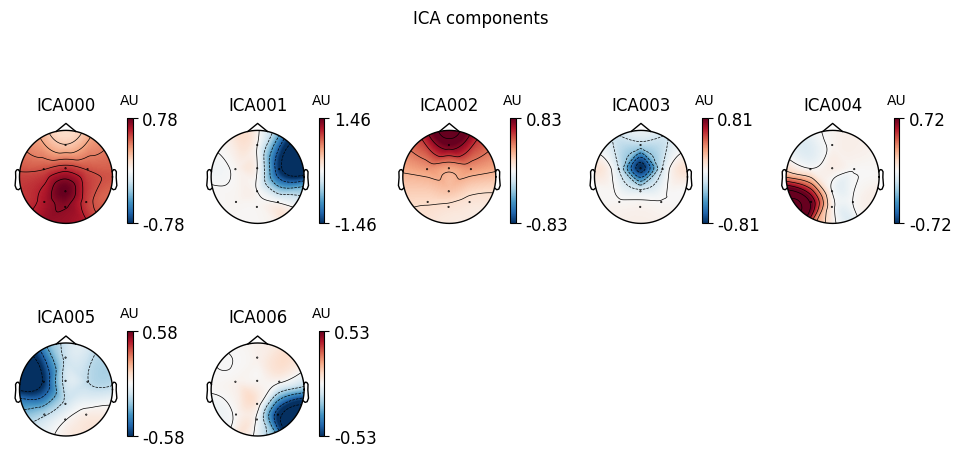

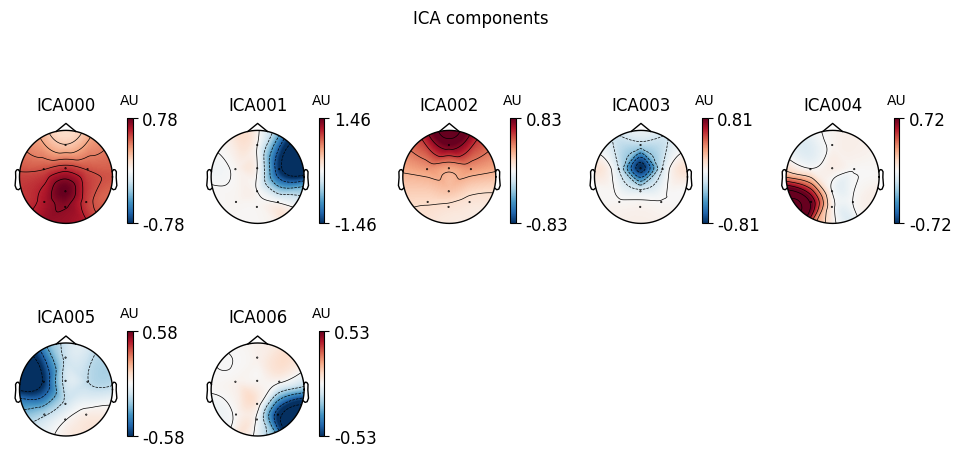

In [11]:
ica.plot_components(colorbar = True)

Using EOG channel: Fz
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2500 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- F

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


[ 0.26135372  0.04246379  0.95045672 -0.22345252  0.05592771 -0.14664349
 -0.05029283] [2]


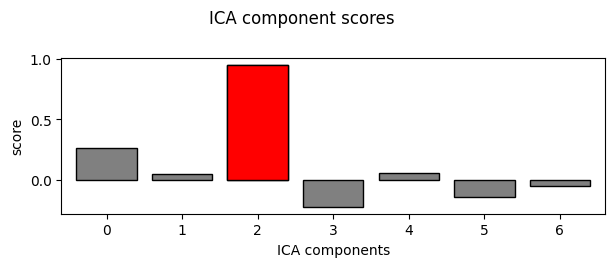

In [12]:
ica_z_thresh = 1.96
eog_indices, eog_scores = ica.find_bads_eog(filt_raw, ch_name = ['Fz'], threshold = ica_z_thresh)
print(eog_scores, eog_indices)

ica.exclude = eog_indices

ica.plot_scores(eog_scores);

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 825 samples (3.300 s)

1200 events found
Event IDs: [1 3]


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s finished


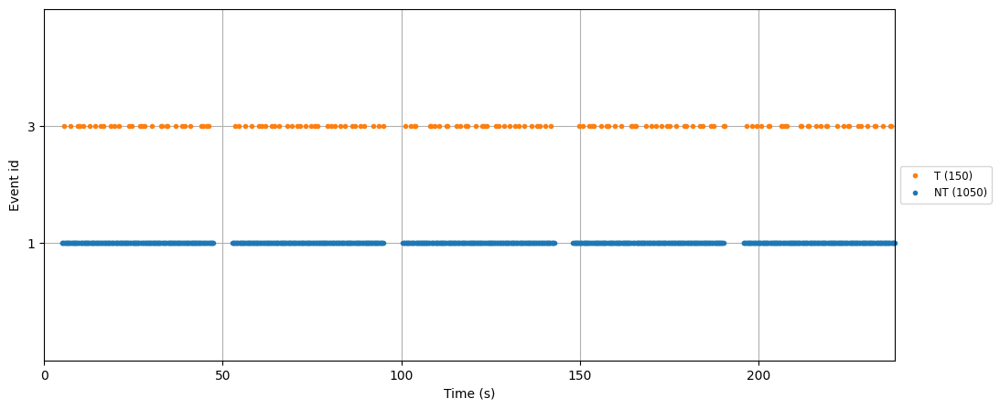

In [13]:
raw = thisRec.copy().filter(l_freq = ica_low_cut, h_freq = hi_cut)

events = mne.find_events(raw, stim_channel = 'STI')
ev_ids = {'NT': 1, 'T': 3}

fig, ax = plt.subplots(figsize = [15, 5])

mne.viz.plot_events(events, raw.info['sfreq'], event_id = ev_ids, axes = ax)
plt.show()

Not setting metadata
1200 matching events found
Setting baseline interval to [-0.6, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 1200 events and 351 original time points ...
0 bad epochs dropped
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


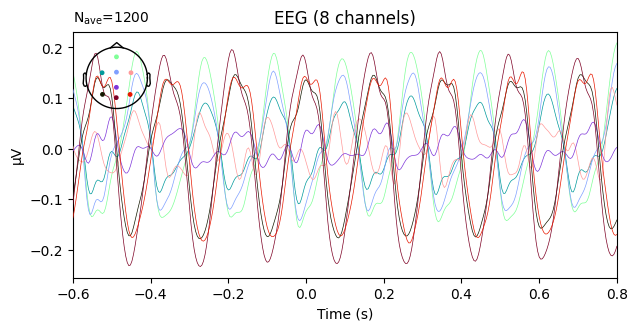

In [14]:
t_a = -.6
t_b = .8

eps = mne.Epochs(raw, events, event_id = ev_ids, tmin = t_a, tmax = t_b, baseline = (None, 0), preload = True)

eps.average().plot(spatial_colors = True, picks = 'eeg');

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


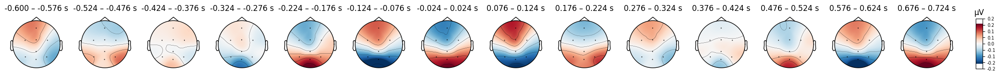

In [15]:
times = np.arange(t_a, t_b, 0.1)

eps.average().plot_topomap(times = times, average = 0.050);

In [16]:
epochs_postica = ica.apply(eps.copy())

Applying ICA to Epochs instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 8 PCA components


<ipython-input-16-6b8f860419f0>:1: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  epochs_postica = ica.apply(eps.copy())


In [17]:
reject = get_rejection_threshold(epochs_postica)
epochs_postica = epochs_postica.drop_bad(reject)
reject

Estimating rejection dictionary for eeg
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting  epoch based on EEG : ['C4']
    Rejecting 

{'eeg': 1.356866037922727e-05}

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


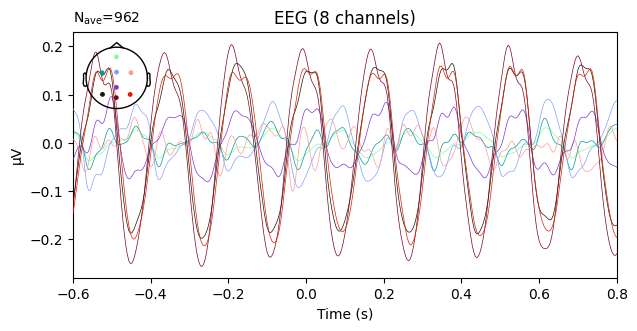

In [18]:
epochs_postica.average().plot(spatial_colors = True);

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


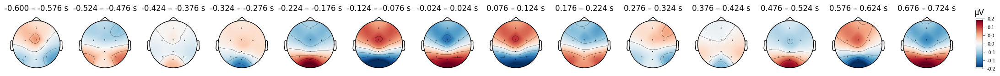

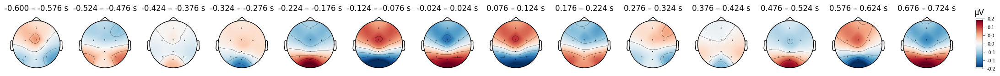

In [19]:
epochs_avgref = epochs_postica.set_eeg_reference(ref_channels = 'average')
epochs_avgref.average().plot_topomap(times = times, average = .050)

In [20]:
df = epochs_avgref.to_data_frame()
df.head()

,time,condition,epoch,Fz,C3,Cz,C4,Pz,PO7,Oz,PO8,STI
0,-0.600,NT,0,0.000804,-0.035481,1.207976,-0.993333,0.279077,-0.922104,0.592159,-0.129097,0.0
1,-0.596,NT,0,0.081529,-0.040227,1.199742,-0.762785,0.213461,-1.099227,0.506499,-0.098993,0.0
2,-0.592,NT,0,0.190335,-0.025919,1.138411,-0.457323,0.077440,-1.254986,0.395721,-0.063679,0.0
3,-0.588,NT,0,0.296886,-0.028701,1.003334,-0.097081,-0.103539,-1.357678,0.296475,-0.009695,0.0
4,-0.584,NT,0,0.377620,-0.073475,0.792148,0.273333,-0.292754,-1.390449,0.240930,0.072648,0.0


In [21]:
df.drop(['STI', 'time'], axis = 1, inplace = True)

df = df.groupby(["epoch", "condition"], as_index = False).agg(
    Fz = ("Fz", pd.Series.to_list),
    C3 = ("C3", pd.Series.to_list),
    Cz = ("Cz", pd.Series.to_list),
    C4 = ("C4", pd.Series.to_list),
    Pz = ("Pz", pd.Series.to_list),
    PO7 = ("PO7", pd.Series.to_list),
    Oz = ("Oz", pd.Series.to_list),
    PO8 = ("PO8", pd.Series.to_list),
)

df.condition[df.condition == 'NT'] = 0
df.condition[df.condition == 'T'] = 1

df.head()

<ipython-input-21-c742a9f02f2f>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.condition[df.condition == 'NT'] = 0
<ipython-input-21-c742a9f02f2f>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.condition[df.condition == 'T'] = 1


,epoch,condition,Fz,C3,Cz,C4,Pz,PO7,Oz,PO8
0,0,0,"[0.0008037214732256135, 0.08152921893197726, 0...","[-0.03548061378878207, -0.0402267625451019, -0...","[1.2079755061462831, 1.1997424097141822, 1.138...","[-0.993332935126389, -0.7627846224034369, -0.4...","[0.2790770785502007, 0.21346057677427588, 0.07...","[-0.9221044471417653, -1.0992268133280405, -1....","[0.5921590206185804, 0.5064987129421719, 0.395...","[-0.1290973307313533, -0.09899272008602758, -0..."
1,1,0,"[0.056505193432819435, -0.10437497710675027, -...","[0.2838284025512647, 0.2751959065511712, 0.305...","[1.6889450958910184, 1.203405105440344, 0.8833...","[0.3104125880021972, 0.49150106366364166, 0.59...","[0.11432276767813385, 0.21792811603681775, 0.2...","[-1.2272155365841426, -1.0431844936095684, -0....","[-0.4610306825776803, -0.3391225014510391, -0....","[-0.7657678283936099, -0.701348219524618, -0.6..."
2,2,0,"[0.9549364583427777, 0.8849270548406516, 0.853...","[0.5969822344634003, 0.6780565206754374, 0.681...","[1.7900199479628827, 1.4886599328308945, 1.155...","[0.2877611177893476, 0.39017745183097874, 0.48...","[-0.7168209142838512, -0.8028761674582127, -0....","[-2.296598826119072, -1.9626064741060707, -1.5...","[-0.5044859566378218, -0.5009389778329605, -0....","[-0.11179406151766395, -0.1753993407807183, -0..."
3,3,0,"[-0.4681590855287837, -0.40071336835168475, -0...","[0.6830797543730437, 0.7110553063401234, 0.700...","[-0.6042769626812633, -0.4316197803259345, -0....","[-1.8472369684086314, -1.804062786927696, -1.7...","[0.4376383991878855, 0.34444133809755234, 0.21...","[2.19465993617095, 2.090216870476415, 1.978128...","[-0.024563356585463457, -0.10679536036809033, ...","[-0.37114171652773753, -0.40252221894068435, -..."
4,4,1,"[-0.5178229191125722, -0.533878123310769, -0.5...","[-0.40649887987633865, -0.4673856038118957, -0...","[0.07599273653828775, 0.032683769046365746, -0...","[0.5240188341119854, 0.7349614393015287, 0.893...","[0.5004560175645892, 0.4167412558339768, 0.290...","[-0.014428586568153448, -0.12472743613281408, ...","[-0.09828970372420724, -0.05016614336260228, 0...","[-0.0634274989335903, -0.00822915756379008, 0...."


In [22]:
file_path = os.path.join(path_mount, path_data, "Preprocessed/", subject)
df.to_json(file_path + "_eeg.json")
print(file_path + "_eeg.json")

/content/drive/MyDrive/Colab Notebooks/data/DataMiningProject/Preprocessed/S1_eeg.json


# **ICA per il paziente S2**

In [23]:
subject = "S2"
file_path = os.path.join(path_mount, path_data, subject)
df = pd.read_json(file_path + ".json")

trigger = np.array(df.trigger)

eeg = df[unicorn_channels].to_numpy()
chs = unicorn_channels
fs = df['sampling_rate'].values[0]

df[df['trigger'] == 1]
df.head()

,Fz,C3,Cz,C4,Pz,PO7,Oz,PO8,trigger,sampling_rate
0,6.428420,7.594652,28.056275,2.656653,5.803757,9.180117,13.724885,2.552954,0,250
1,9.338059,10.353145,30.985479,5.632187,9.127831,13.917757,16.905158,4.237270,0,250
2,10.414381,11.011678,30.768124,6.350915,10.064131,15.653186,17.332154,4.300393,0,250
3,9.359372,9.273105,27.058813,4.745999,8.338058,13.561741,15.266949,2.728759,0,250
4,7.016563,6.024870,21.249043,1.944192,4.845410,8.704462,11.863621,0.228920,0,250


Creating RawArray with float64 data, n_channels=8, n_times=60806
    Range : 0 ... 60805 =      0.000 ...   243.220 secs
Ready.
60806
[ 1250  1294  1339 ... 59385 59430 59473] 1200 [-1 -1  1 ... -1 -1 -1] 1200
Ones [1. 1. 1. ... 1. 1. 1.] 1050
Threes [3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3.] 150
stim_data =  [[0. 0. 0. ... 0. 0. 0.]]
Creating RawArray with float64 data, n_channels=1, n_times=60806
    Range : 0 ... 60805 =      0.000 ...   243.220 secs
Ready.
stim_raw =  <RawArray | 1 x 60806 (243.2 s), ~481 kB, data loaded>


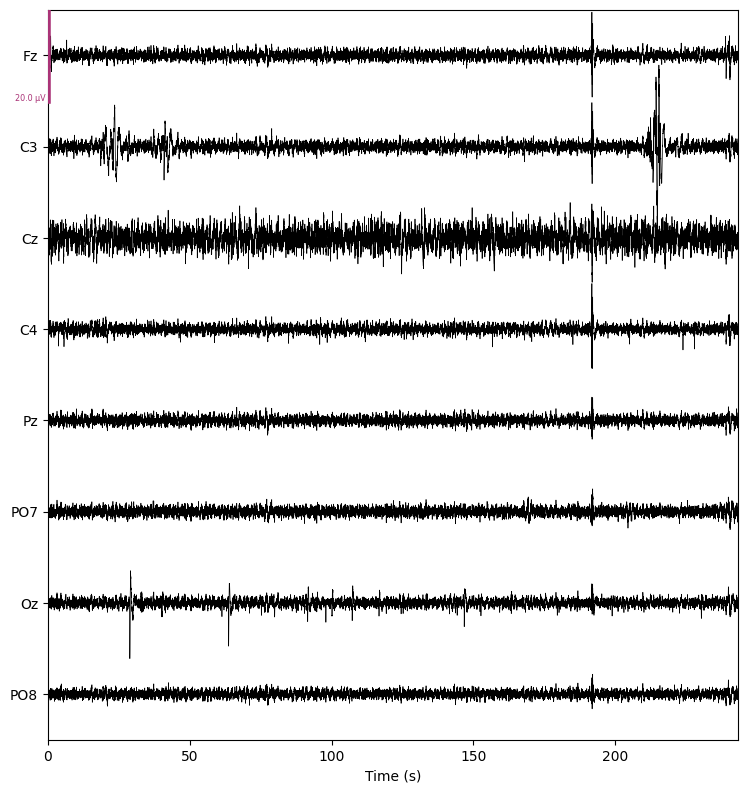

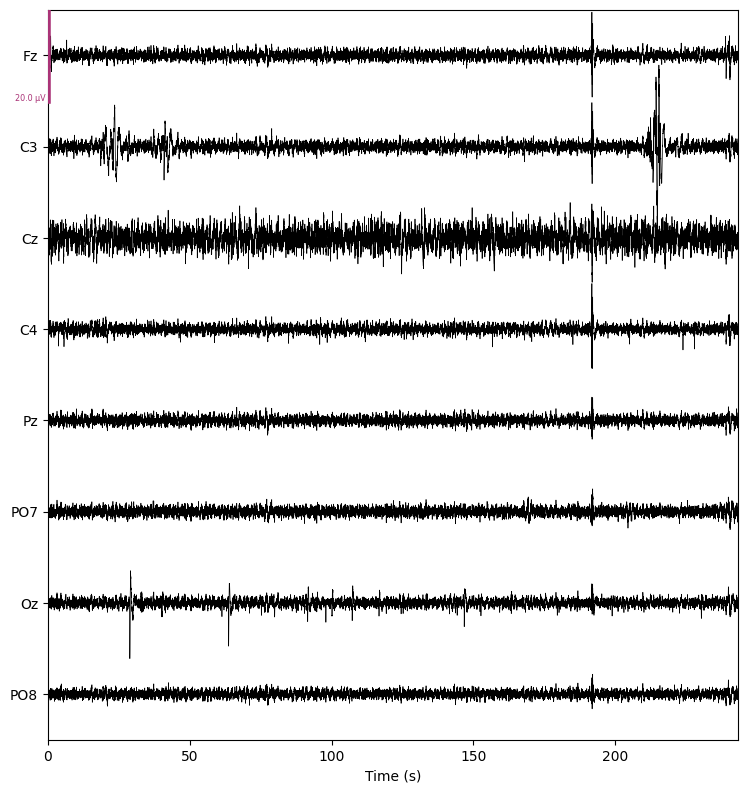

In [24]:
thisRec = RawArray(eeg.T/1e7, create_info(chs, fs, ch_types='eeg'))

# Get event indexes where value is not 0, i.e. -1 or 1
pos = np.where(trigger != 0)[0]

print(len(trigger))
# Filter 0 values from the trigger array
y = trigger[trigger != 0]
print(pos, len(pos), y, len(y))

# Create the stimuli channel
stim_data = np.zeros((1, thisRec.n_times))

# MNE works with absolute values of labels so -1 and +1 would result in only one kind of event
# that's why we add 2 and obtain 1 and 3 as label values
stim_data[0,pos] = y + 2
ones = stim_data[stim_data == 1]
threes = stim_data[stim_data == 3]
print("Ones", ones, len(ones))
print("Threes", threes, len(threes))
print('stim_data = ', stim_data)
stim_raw = RawArray(stim_data, create_info(['STI'], thisRec.info['sfreq'], ch_types=['stim']))
print('stim_raw = ', stim_raw)
# adding the stimuli channel (as a Raw object) to our EEG Raw object
thisRec.add_channels([stim_raw])

# Set the standard 10-20 montage
montage = make_standard_montage('standard_1020')
thisRec.set_montage(montage)

thisRec.plot(n_channels = len(unicorn_channels), show_scrollbars = False, duration = 400, scalings = 10e-6)

**Fittiamo ICA su tutto il segnale raw filtrato, e con epoche di 1s**

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 825 samples (3.300 s)

Not setting metadata
243 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 243 events and 251 original time points ...
0 bad epochs dropped
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s finished


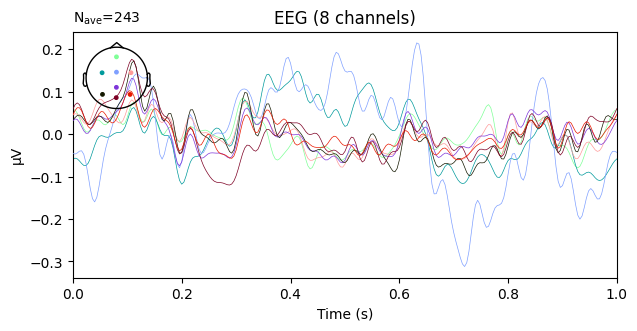

In [25]:
# Preprocessing with ICA

ica_low_cut = 1.0
hi_cut  = 30

filt_raw = thisRec.copy().filter(l_freq = ica_low_cut, h_freq = hi_cut)

t_a = 0
t_b = 1

d = t_b - t_a

events_ica = mne.make_fixed_length_events(filt_raw, duration = d)
epochs_ica = mne.Epochs(filt_raw, events_ica, tmin = t_a, tmax = t_b, baseline = None, preload = True)


epochs_ica.average().plot(spatial_colors = True);

In [26]:


reject = get_rejection_threshold(epochs_ica)
epochs_ica = epochs_ica.drop_bad(reject)
reject

Estimating rejection dictionary for eeg
    Rejecting  epoch based on EEG : ['C3']
    Rejecting  epoch based on EEG : ['Oz']
    Rejecting  epoch based on EEG : ['Oz']
    Rejecting  epoch based on EEG : ['Cz']
    Rejecting  epoch based on EEG : ['Cz']
    Rejecting  epoch based on EEG : ['Fz', 'C3', 'Cz', 'C4']
    Rejecting  epoch based on EEG : ['C3']
    Rejecting  epoch based on EEG : ['C3']
8 bad epochs dropped


{'eeg': 1.1979810623766529e-05}

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Selecting by explained variance: 7 components
Fitting ICA took 1.0s.
Creating RawArray with float64 data, n_channels=7, n_times=60806
    Range : 0 ... 60805 =      0.000 ...   243.220 secs
Ready.


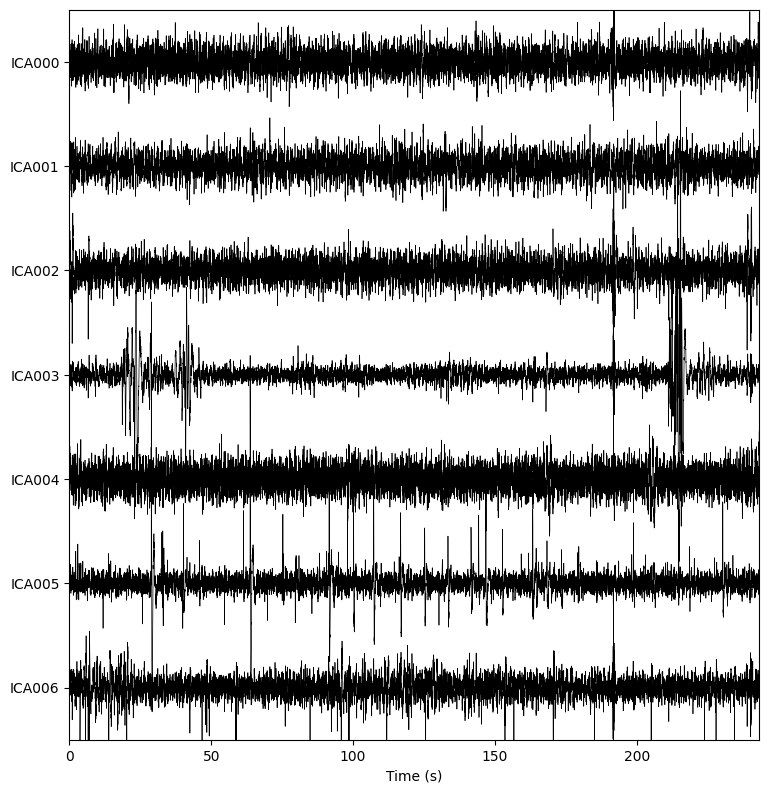

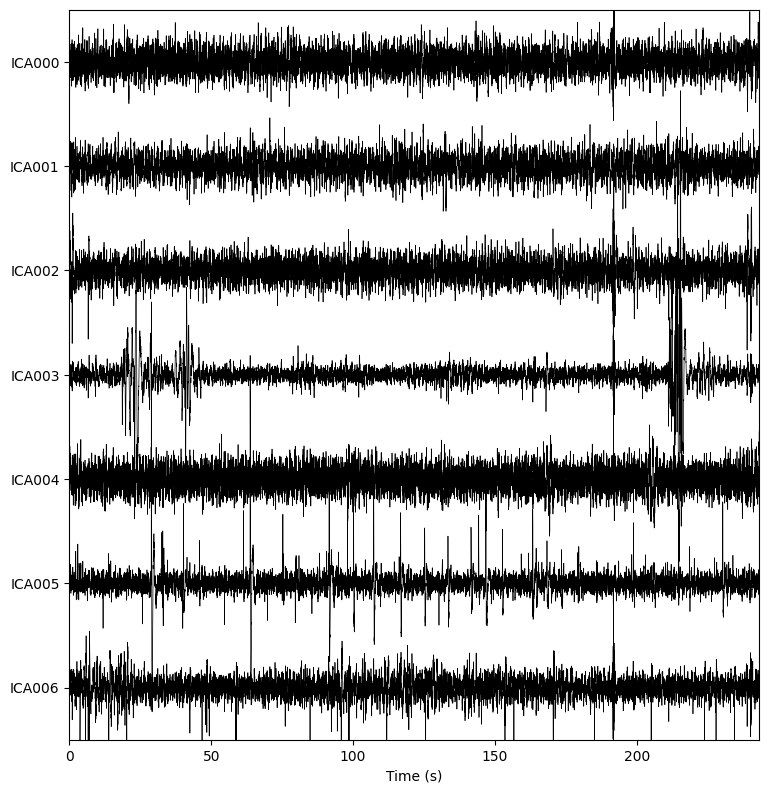

In [27]:
n_components = 0.99

ica = mne.preprocessing.ICA(n_components = n_components, max_iter = 'auto', random_state = 0)
ica.fit(epochs_ica, tstep = d)
ica.plot_sources(filt_raw, show_scrollbars = False, stop = 400)

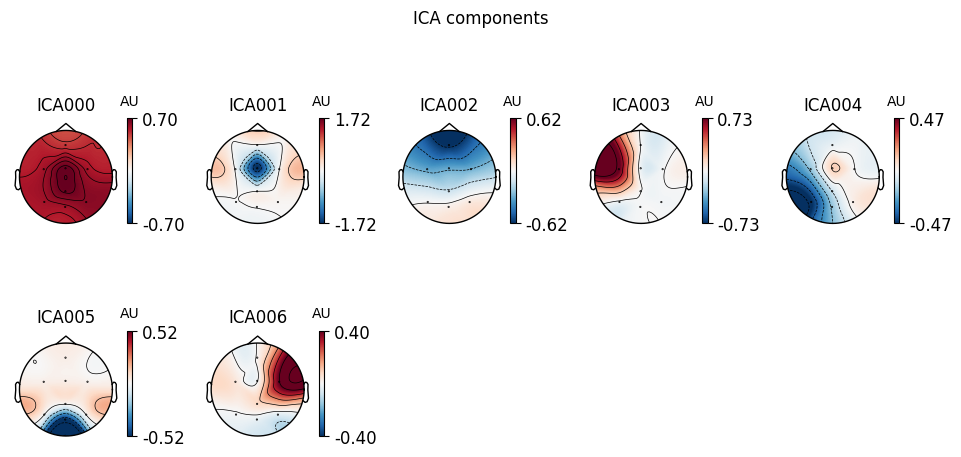

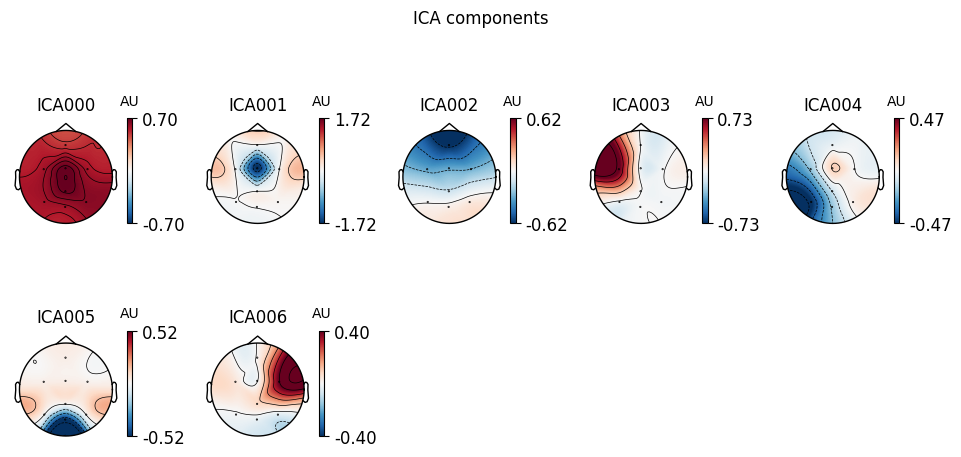

In [28]:
ica.plot_components(colorbar = True)

Using EOG channel: Fz
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2500 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- F

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


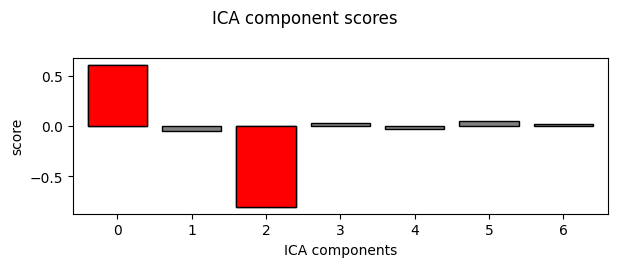

[ 0.60796104 -0.05007268 -0.80397059  0.03246832 -0.02809188  0.04979236
  0.02091183]


In [29]:
ica_z_thresh = 1.96
eog_indices, eog_scores = ica.find_bads_eog(filt_raw, ch_name = ['Fz'], threshold = ica_z_thresh)
ica.exclude = eog_indices



ica.plot_scores(eog_scores)

print(eog_scores)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 825 samples (3.300 s)

1200 events found
Event IDs: [1 3]


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished


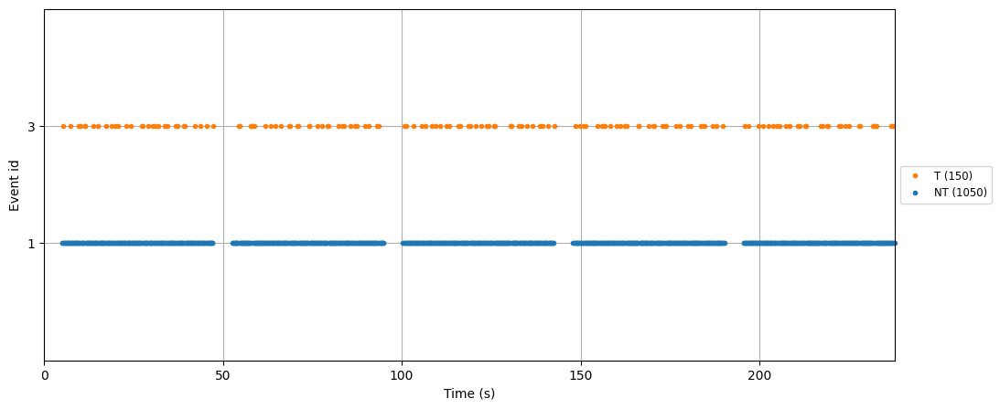

In [30]:
raw = thisRec.copy().filter(l_freq = ica_low_cut, h_freq = hi_cut)

events = mne.find_events(raw, stim_channel = 'STI')
ev_ids = {'NT': 1, 'T': 3}

fig, ax = plt.subplots(figsize = [15, 5])

mne.viz.plot_events(events, raw.info['sfreq'], event_id = ev_ids, axes = ax)
plt.show()

Not setting metadata
1200 matching events found
Setting baseline interval to [-0.6, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 1200 events and 351 original time points ...
0 bad epochs dropped
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


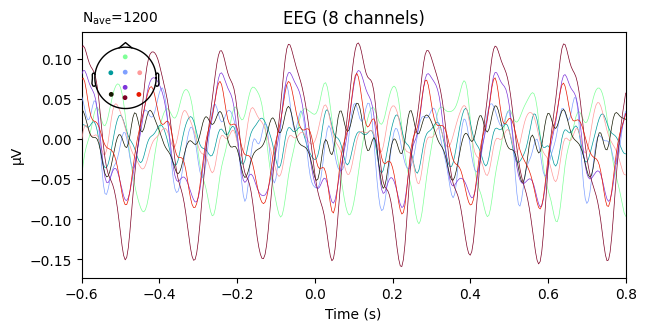

In [31]:
t_a = -.6
t_b = .8

eps = mne.Epochs(raw, events, event_id = ev_ids, tmin = t_a, tmax = t_b, baseline = (None, 0), preload = True)

eps.average().plot(spatial_colors = True, picks = 'eeg');

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


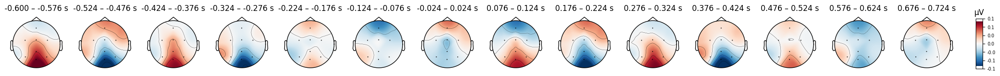

In [32]:
times = np.arange(t_a, t_b, 0.1)

eps.average().plot_topomap(times = times, average = 0.050);

In [33]:
epochs_postica = ica.apply(eps.copy())

Applying ICA to Epochs instance
    Transforming to ICA space (7 components)
    Zeroing out 2 ICA components
    Projecting back using 8 PCA components


<ipython-input-33-6b8f860419f0>:1: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  epochs_postica = ica.apply(eps.copy())


In [34]:
reject = get_rejection_threshold(epochs_postica)
epochs_postica = epochs_postica.drop_bad(reject)
reject

Estimating rejection dictionary for eeg
    Rejecting  epoch based on EEG : ['C3']
    Rejecting  epoch based on EEG : ['C3']
    Rejecting  epoch based on EEG : ['C3']
    Rejecting  epoch based on EEG : ['C3']
    Rejecting  epoch based on EEG : ['C3']
    Rejecting  epoch based on EEG : ['C3']
    Rejecting  epoch based on EEG : ['C3']
    Rejecting  epoch based on EEG : ['C3']
    Rejecting  epoch based on EEG : ['C3']
    Rejecting  epoch based on EEG : ['Oz']
    Rejecting  epoch based on EEG : ['Oz']
    Rejecting  epoch based on EEG : ['Oz']
    Rejecting  epoch based on EEG : ['Oz']
    Rejecting  epoch based on EEG : ['Oz']
    Rejecting  epoch based on EEG : ['Oz']
    Rejecting  epoch based on EEG : ['Oz']
    Rejecting  epoch based on EEG : ['Oz']
    Rejecting  epoch based on EEG : ['C3']
    Rejecting  epoch based on EEG : ['C3']
    Rejecting  epoch based on EEG : ['C3']
    Rejecting  epoch based on EEG : ['C3']
    Rejecting  epoch based on EEG : ['C3']
    Rejecting 

{'eeg': 1.216497064095255e-05}

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


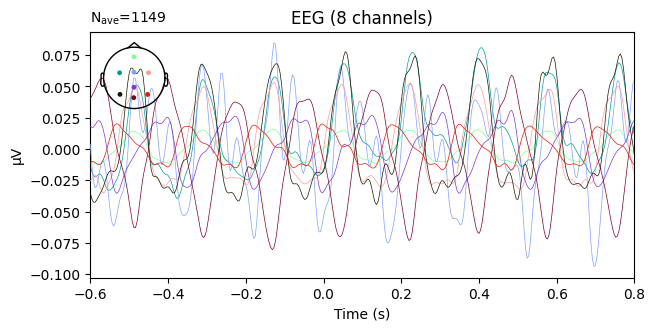

In [35]:
epochs_postica.average().plot(spatial_colors = True);

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


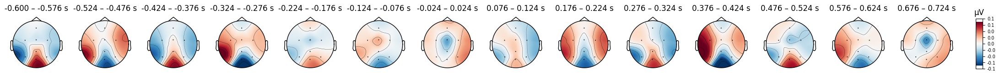

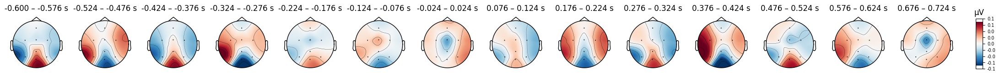

In [36]:
epochs_avgref = epochs_postica.set_eeg_reference(ref_channels = 'average')
epochs_avgref.average().plot_topomap(times = times, average = .050)

In [37]:
df = epochs_avgref.to_data_frame()
df.tail()

,time,condition,epoch,Fz,C3,Cz,C4,Pz,PO7,Oz,PO8,STI
403294,0.784,NT,1199,0.019463,-0.104378,-0.170876,0.224520,-0.086861,0.470582,-0.324294,-0.028157,0.0
403295,0.788,NT,1199,0.062376,-0.201601,-0.221488,0.268812,-0.155172,0.474029,-0.295099,0.068143,0.0
403296,0.792,NT,1199,0.082712,-0.270033,-0.227867,0.271254,-0.194300,0.417811,-0.210293,0.130715,0.0
403297,0.796,NT,1199,0.083106,-0.308819,-0.197214,0.247576,-0.192784,0.317997,-0.103618,0.153757,0.0
403298,0.800,NT,1199,0.066396,-0.330024,-0.142947,0.217174,-0.149642,0.209594,-0.004486,0.133934,0.0


In [38]:
df.drop(['STI', 'time'], axis = 1, inplace = True)

df = df.groupby(["epoch", "condition"], as_index = False).agg(
    Fz = ("Fz", pd.Series.to_list),
    C3 = ("C3", pd.Series.to_list),
    Cz = ("Cz", pd.Series.to_list),
    C4 = ("C4", pd.Series.to_list),
    Pz = ("Pz", pd.Series.to_list),
    PO7 = ("PO7", pd.Series.to_list),
    Oz = ("Oz", pd.Series.to_list),
    PO8 = ("PO8", pd.Series.to_list),
)

df.condition[df.condition == 'NT'] = 0
df.condition[df.condition == 'T'] = 1

df.head()

<ipython-input-38-c742a9f02f2f>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.condition[df.condition == 'NT'] = 0
<ipython-input-38-c742a9f02f2f>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.condition[df.condition == 'T'] = 1


,epoch,condition,Fz,C3,Cz,C4,Pz,PO7,Oz,PO8
0,0,0,"[-0.18557583042441514, -0.22410717910987443, -...","[-0.5830053420011322, -0.5674856422020088, -0....","[1.3484414113388727, 1.4164026140557309, 1.395...","[-0.04197134779571159, -0.059699784911075145, ...","[0.03556177048355493, 0.04891672484717122, 0.0...","[-0.29704207330970833, -0.25603805834719806, -...","[0.022566619439365956, 0.014262965611116887, -...","[-0.29897520773082625, -0.3722516399438622, -0..."
1,1,0,"[0.054785405985219325, 0.09724704243995255, 0....","[-0.2946071225928723, -0.3958182199596648, -0....","[-0.2477043682897797, -0.4051385178506007, -0....","[0.3631121549569352, 0.4359860468452612, 0.429...","[0.3452818845144469, 0.30444621703542496, 0.24...","[-0.23678726645551482, -0.12858925728646362, -...","[0.031019329825877556, 0.034980336910586746, 0...","[-0.01510001794431225, 0.05688635186550363, 0...."
2,2,1,"[0.20645315300889805, 0.2069561847107927, 0.22...","[0.3536902962942846, 0.41563915469580504, 0.48...","[-1.0031967581913754, -1.3319550058124536, -1....","[-0.010783207044960384, -0.13966758523094316, ...","[0.3471420712272317, 0.345938393721897, 0.3360...","[0.3827362791645164, 0.5122368264258267, 0.640...","[-0.416912745192508, -0.17384803807594743, 0.0...","[0.14087091073391325, 0.16470006956502284, 0.2..."
3,3,0,"[-0.20934742302935969, -0.2652530460930002, -0...","[0.06527958542848632, -0.012649280746086294, -...","[1.7621903501100789, 1.8475073060837055, 1.866...","[-0.6580116512386798, -0.6493086649928107, -0....","[-0.294903983835654, -0.2575526099310049, -0.2...","[-0.22293236177671708, -0.17504063717977725, -...","[-0.20849297141663412, -0.14893921599659005, -...","[-0.23378154424152084, -0.33876385114443613, -..."
4,4,0,"[-0.02242240711413117, -0.01662862855970616, 0...","[-0.05981983750866509, -0.026582653419728403, ...","[-0.4550142915002156, -0.46360750210513163, -0...","[0.16185548655572898, 0.17341908898011704, 0.2...","[-0.2312195789745383, -0.23423597121463316, -0...","[0.4574360372491764, 0.5159838646917012, 0.443...","[0.13440328742582655, 0.0430235727465145, -0.0...","[0.014781303866818305, 0.00862822888086663, 0...."


In [39]:
file_path = os.path.join(path_mount, path_data, "Preprocessed/", subject)
df.to_json(file_path + "_eeg.json")
print(file_path + "_eeg.json")

/content/drive/MyDrive/Colab Notebooks/data/DataMiningProject/Preprocessed/S2_eeg.json


# **ICA per il paziente S3**

In [40]:
subject = "S3"
file_path = os.path.join(path_mount, path_data, subject)
df = pd.read_json(file_path + ".json")

trigger = np.array(df.trigger)

eeg = df[unicorn_channels].to_numpy()
chs = unicorn_channels
fs = df['sampling_rate'].values[0]

df[df['trigger'] == 1]
df.head()

,Fz,C3,Cz,C4,Pz,PO7,Oz,PO8,trigger,sampling_rate
0,4.971165,2.954857,5.434578,4.031414,4.506413,3.365448,5.225260,2.212289,0,250
1,5.438408,3.299078,5.046350,3.518238,4.258958,4.016732,5.571914,2.180787,0,250
2,4.497014,2.658318,3.432136,2.080018,3.277825,4.103722,5.713662,2.023342,0,250
3,1.851196,0.672267,0.489308,-0.344777,1.470760,3.230503,5.383687,1.401167,0,250
4,-2.040050,-2.437599,-3.295676,-3.402772,-0.952964,1.417418,4.467268,0.166012,0,250


Creating RawArray with float64 data, n_channels=8, n_times=60955
    Range : 0 ... 60954 =      0.000 ...   243.816 secs
Ready.
60955
[ 1267  1310  1354 ... 59471 59516 59559] 1200 [-1 -1 -1 ... -1 -1 -1] 1200
Ones [1. 1. 1. ... 1. 1. 1.] 1050
Threes [3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3.] 150
stim_data =  [[0. 0. 0. ... 0. 0. 0.]]
Creating RawArray with float64 data, n_channels=1, n_times=60955
    Range : 0 ... 60954 =      0.000 ...   243.816 secs
Ready.
stim_raw =  <RawArray | 1 x 60955 (243.8 s), ~483 kB, data loaded>


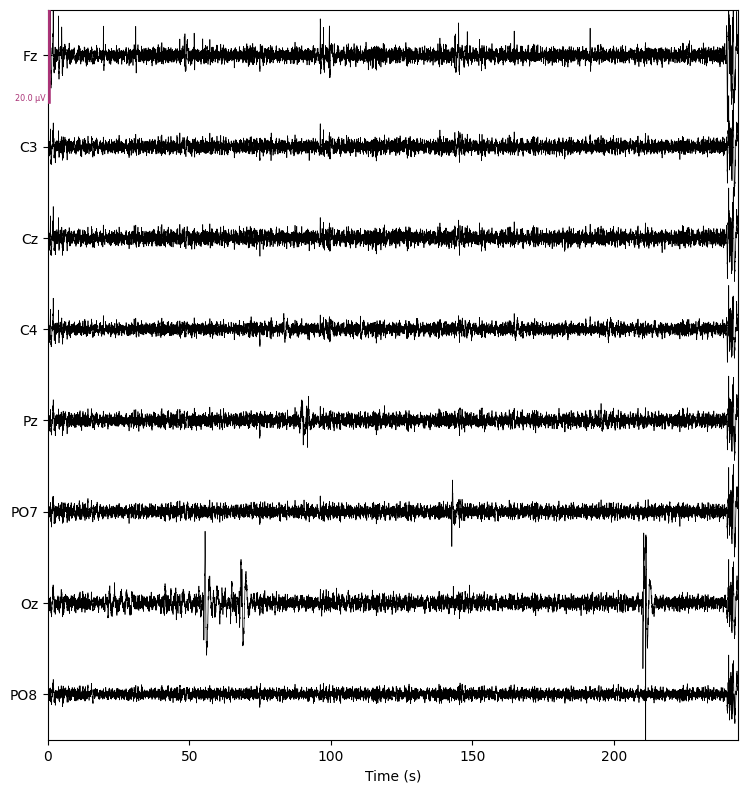

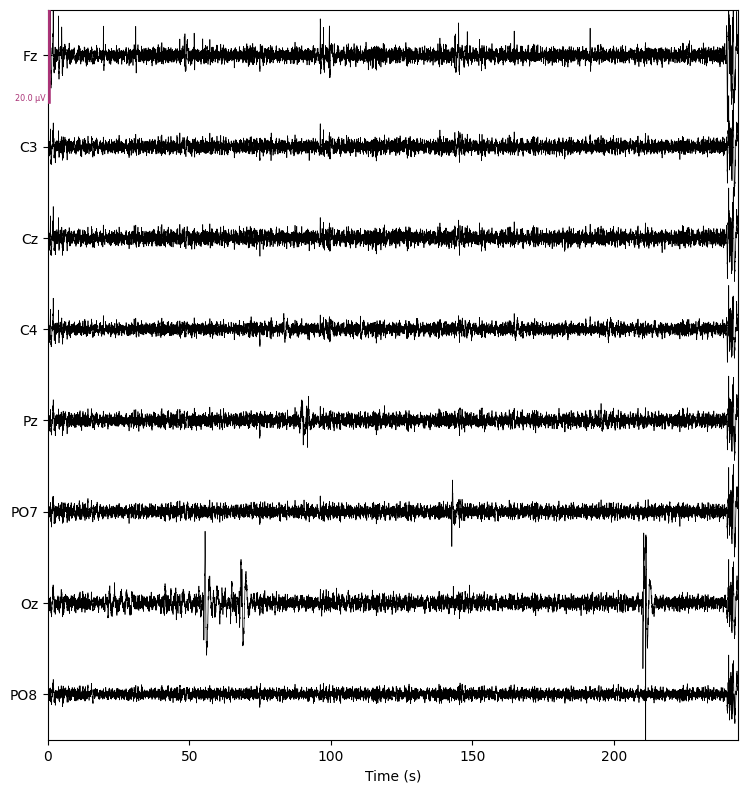

In [41]:
thisRec = RawArray(eeg.T/1e7, create_info(chs, fs, ch_types='eeg'))

# Get event indexes where value is not 0, i.e. -1 or 1
pos = np.where(trigger != 0)[0]

print(len(trigger))
# Filter 0 values from the trigger array
y = trigger[trigger != 0]
print(pos, len(pos), y, len(y))

# Create the stimuli channel
stim_data = np.zeros((1, thisRec.n_times))

# MNE works with absolute values of labels so -1 and +1 would result in only one kind of event
# that's why we add 2 and obtain 1 and 3 as label values
stim_data[0,pos] = y + 2
ones = stim_data[stim_data == 1]
threes = stim_data[stim_data == 3]
print("Ones", ones, len(ones))
print("Threes", threes, len(threes))
print('stim_data = ', stim_data)
stim_raw = RawArray(stim_data, create_info(['STI'], thisRec.info['sfreq'], ch_types=['stim']))
print('stim_raw = ', stim_raw)
# adding the stimuli channel (as a Raw object) to our EEG Raw object
thisRec.add_channels([stim_raw])

# Set the standard 10-20 montage
montage = make_standard_montage('standard_1020')
thisRec.set_montage(montage)

thisRec.plot(n_channels = len(unicorn_channels), show_scrollbars = False, duration = 400, scalings = 10e-6)

**Fittiamo ICA su tutto il segnale raw filtrato, e con epoche di 1s**

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 825 samples (3.300 s)

Not setting metadata
243 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 243 events and 251 original time points ...
0 bad epochs dropped
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished


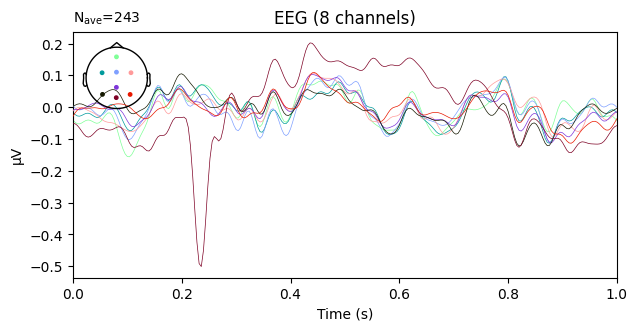

In [42]:
# Preprocessing with ICA

ica_low_cut = 1.0
hi_cut  = 30

filt_raw = thisRec.copy().filter(l_freq = ica_low_cut, h_freq = hi_cut)

t_a = 0
t_b = 1

d = t_b - t_a

events_ica = mne.make_fixed_length_events(filt_raw, duration = d)
epochs_ica = mne.Epochs(filt_raw, events_ica, tmin = t_a, tmax = t_b, baseline = None, preload = True)


epochs_ica.average().plot(spatial_colors = True);

In [43]:


reject = get_rejection_threshold(epochs_ica)
epochs_ica = epochs_ica.drop_bad(reject)
reject

Estimating rejection dictionary for eeg
    Rejecting  epoch based on EEG : ['Fz', 'C3', 'Cz', 'C4']
    Rejecting  epoch based on EEG : ['Fz', 'C3', 'Cz', 'C4', 'Pz', 'PO7', 'Oz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz', 'Cz', 'C4']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Oz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Oz']
    Rejecting  epoch based on EEG : ['Oz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Oz']
    Rejecting  epoch based on EEG : ['Oz']
    Rejecting  epoch based on EEG : ['Oz']
    Rejecting  epoch based on EEG : ['Oz']
    Rejecting  epoch based on EEG : ['Oz']
    Rejecting  epoch based on EEG : ['Oz']
    Rejecting  epoch based on EEG : ['Oz']
    Rejecting  epoch based on EEG

{'eeg': 5.946107609986254e-06}

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Selecting by explained variance: 7 components
Fitting ICA took 0.7s.
Creating RawArray with float64 data, n_channels=7, n_times=60955
    Range : 0 ... 60954 =      0.000 ...   243.816 secs
Ready.


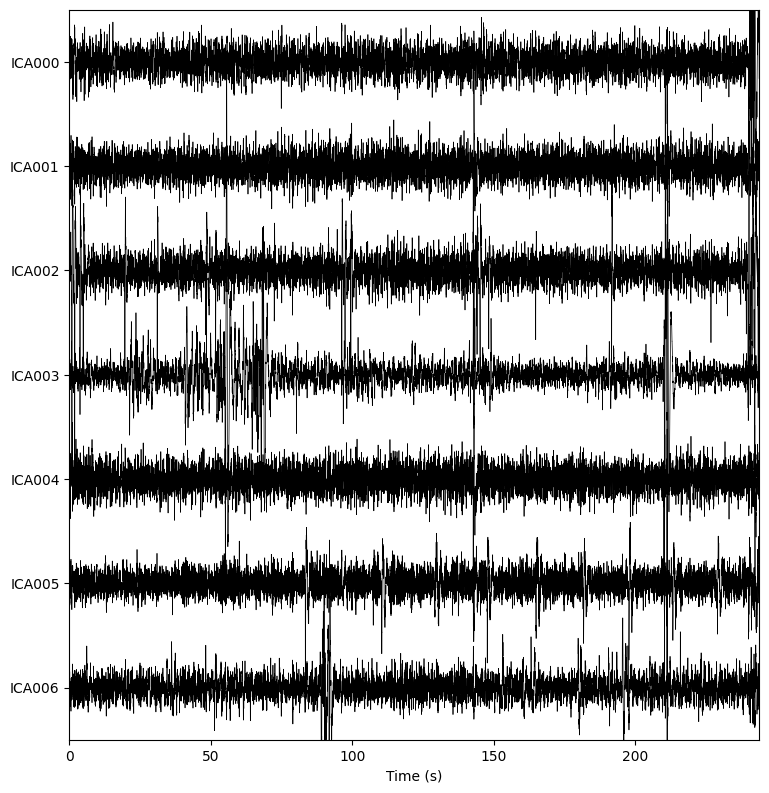

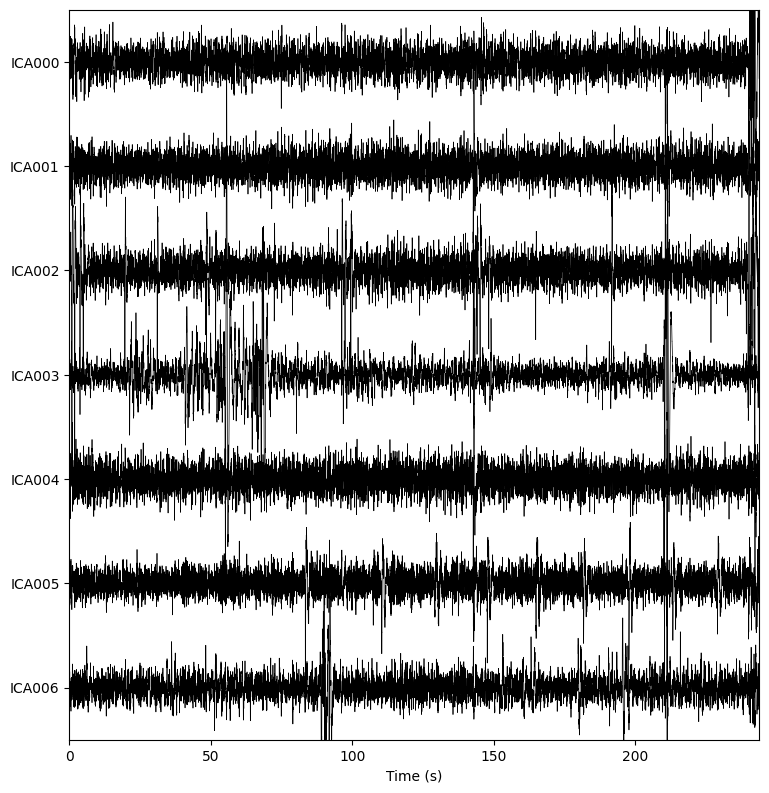

In [44]:
n_components = 0.99

ica = mne.preprocessing.ICA(n_components = n_components, max_iter = 'auto', random_state = 0)
ica.fit(epochs_ica, tstep = d)
ica.plot_sources(filt_raw, show_scrollbars = False, stop = 400)

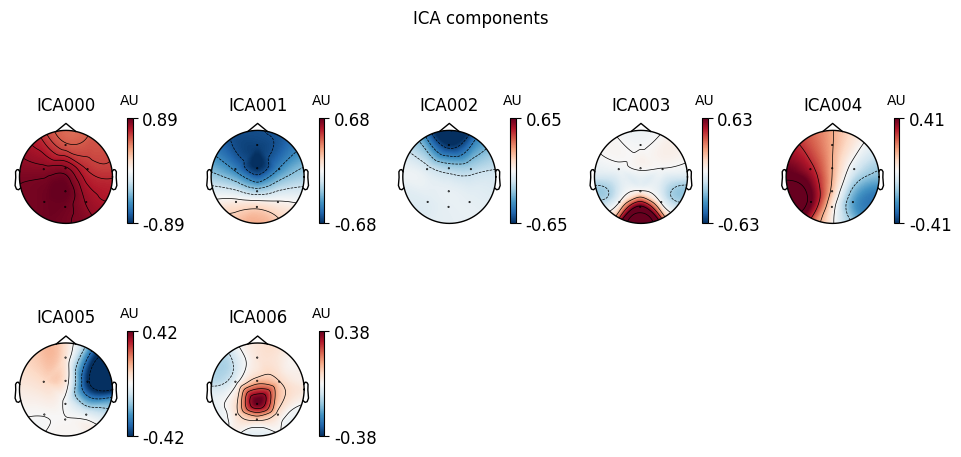

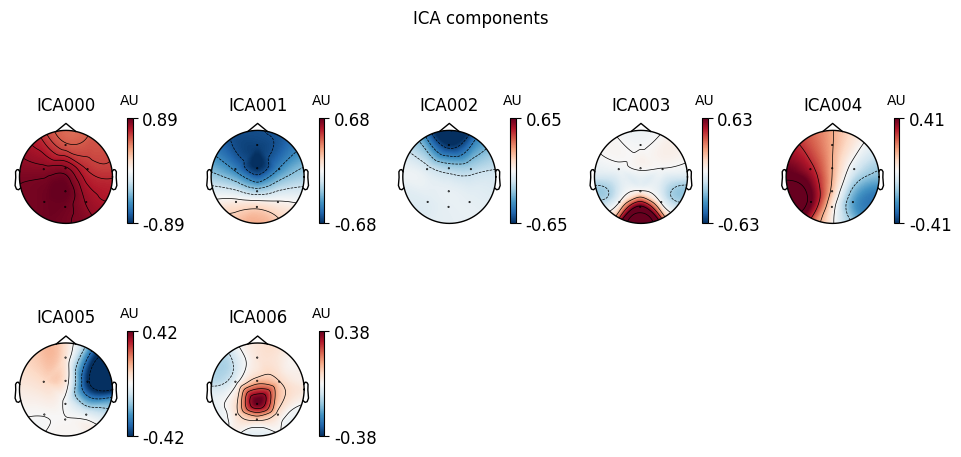

In [45]:
ica.plot_components(colorbar = True)

Using EOG channel: Fz
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2500 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- F

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


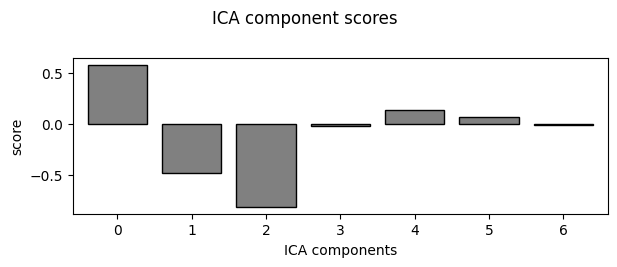

In [46]:
ica_z_thresh = 1.96
eog_indices, eog_scores = ica.find_bads_eog(filt_raw, ch_name = ['Fz'], threshold = ica_z_thresh)
ica.exclude = eog_indices

ica.plot_scores(eog_scores);

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 825 samples (3.300 s)

1200 events found
Event IDs: [1 3]


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished


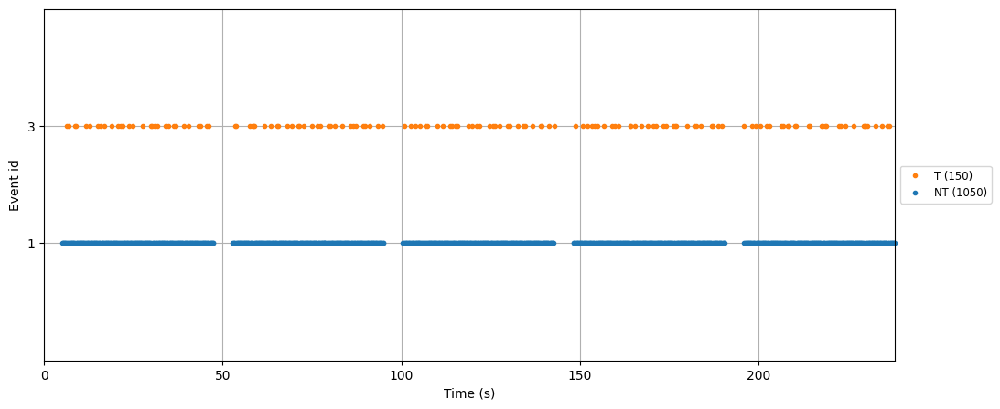

In [47]:
raw = thisRec.copy().filter(l_freq = ica_low_cut, h_freq = hi_cut)

events = mne.find_events(raw, stim_channel = 'STI')
ev_ids = {'NT': 1, 'T': 3}

fig, ax = plt.subplots(figsize = [15, 5])

mne.viz.plot_events(events, raw.info['sfreq'], event_id = ev_ids, axes = ax)
plt.show()

Not setting metadata
1200 matching events found
Setting baseline interval to [-0.6, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 1200 events and 351 original time points ...
0 bad epochs dropped
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


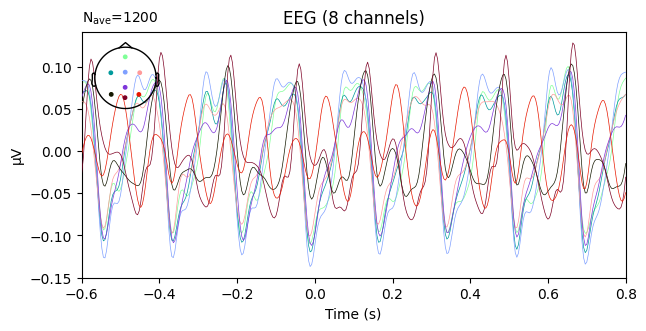

In [48]:
t_a = -.6
t_b = .8

eps = mne.Epochs(raw, events, event_id = ev_ids, tmin = t_a, tmax = t_b, baseline = (None, 0), preload = True)

eps.average().plot(spatial_colors = True, picks = 'eeg');

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


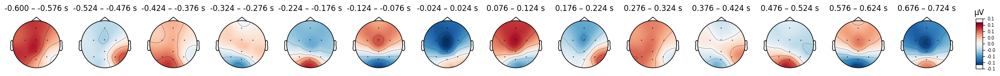

In [49]:
times = np.arange(t_a, t_b, 0.1)

eps.average().plot_topomap(times = times, average = 0.050);

In [50]:
epochs_postica = ica.apply(eps.copy())

Applying ICA to Epochs instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 8 PCA components


<ipython-input-50-6b8f860419f0>:1: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  epochs_postica = ica.apply(eps.copy())


In [51]:
reject = get_rejection_threshold(epochs_postica)
epochs_postica = epochs_postica.drop_bad(reject)
reject

Estimating rejection dictionary for eeg
    Rejecting  epoch based on EEG : ['Oz']
    Rejecting  epoch based on EEG : ['Oz']
    Rejecting  epoch based on EEG : ['Oz']
    Rejecting  epoch based on EEG : ['Oz']
    Rejecting  epoch based on EEG : ['Oz']
    Rejecting  epoch based on EEG : ['Oz']
    Rejecting  epoch based on EEG : ['Oz']
    Rejecting  epoch based on EEG : ['Oz']
    Rejecting  epoch based on EEG : ['Oz']
    Rejecting  epoch based on EEG : ['Oz']
    Rejecting  epoch based on EEG : ['Oz']
11 bad epochs dropped


{'eeg': 2.8415320429077777e-05}

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


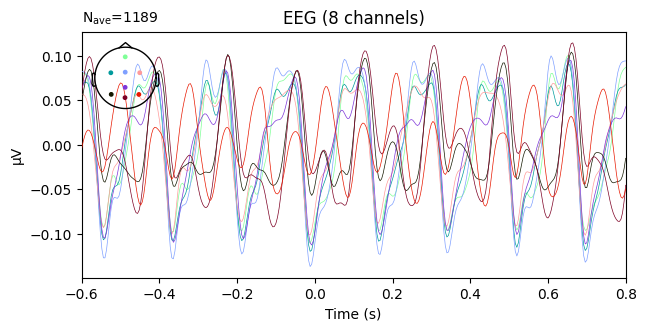

In [52]:
epochs_postica.average().plot(spatial_colors = True);

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


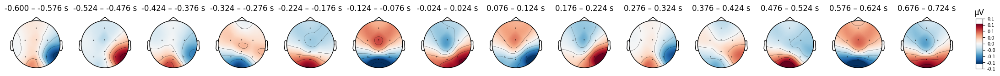

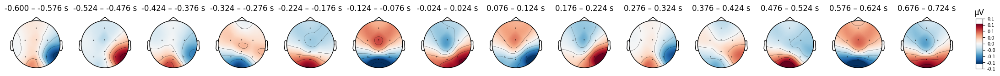

In [53]:
epochs_avgref = epochs_postica.set_eeg_reference(ref_channels = 'average')
epochs_avgref.average().plot_topomap(times = times, average = .050)

In [54]:
df = epochs_avgref.to_data_frame()
df.tail()

,time,condition,epoch,Fz,C3,Cz,C4,Pz,PO7,Oz,PO8,STI
417334,0.784,NT,1199,-0.196365,-0.367061,-0.483676,-0.112947,0.080807,0.439574,0.299264,0.340405,0.0
417335,0.788,NT,1199,-0.101942,-0.235302,-0.391101,-0.066188,0.027765,0.429766,0.003105,0.333897,0.0
417336,0.792,NT,1199,0.034731,-0.095867,-0.285523,-0.031563,-0.022496,0.379831,-0.286608,0.307496,0.0
417337,0.796,NT,1199,0.181529,0.032043,-0.184477,-0.025817,-0.058105,0.302918,-0.518306,0.270215,0.0
417338,0.800,NT,1199,0.310240,0.132236,-0.102468,-0.048731,-0.073678,0.221489,-0.663131,0.224043,0.0


In [55]:
df.drop(['STI', 'time'], axis = 1, inplace = True)

df = df.groupby(["epoch", "condition"], as_index = False).agg(
    Fz = ("Fz", pd.Series.to_list),
    C3 = ("C3", pd.Series.to_list),
    Cz = ("Cz", pd.Series.to_list),
    C4 = ("C4", pd.Series.to_list),
    Pz = ("Pz", pd.Series.to_list),
    PO7 = ("PO7", pd.Series.to_list),
    Oz = ("Oz", pd.Series.to_list),
    PO8 = ("PO8", pd.Series.to_list),
)

df.condition[df.condition == 'NT'] = 0
df.condition[df.condition == 'T'] = 1

df.head()

<ipython-input-55-c742a9f02f2f>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.condition[df.condition == 'NT'] = 0
<ipython-input-55-c742a9f02f2f>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.condition[df.condition == 'T'] = 1


,epoch,condition,Fz,C3,Cz,C4,Pz,PO7,Oz,PO8
0,0,0,"[0.08854437205243425, 0.23203980209673528, 0.3...","[-0.18050320508466994, -0.1435239163390937, -0...","[-0.20002040402973667, -0.13634382372230008, -...","[0.017048727932954644, -0.025928369812898505, ...","[-0.12736635490574774, -0.13580883616807862, -...","[0.5432482535704748, 0.48229751691022266, 0.40...","[-0.3029450056784304, -0.36426387750597733, -0...","[0.16199361614272098, 0.09153150454139056, 0.0..."
1,1,0,"[0.5289763019093026, 0.6975086458062589, 0.813...","[-0.131653234300061, -0.1860430453984808, -0.2...","[0.06523960419770343, 0.1519068132612111, 0.26...","[-0.01768036841132978, 0.08653842592631691, 0....","[-0.058573547524743294, -0.057598265962030104,...","[0.06805800429711814, -0.03386814589876047, -0...","[-0.09503730184316225, -0.18224180054992273, -...","[-0.35932945832482766, -0.47620262718459333, -..."
2,2,0,"[0.1758614537969487, 0.1675654542500214, 0.191...","[-0.23390673790276578, -0.1600182069423775, -0...","[-0.4508580967687904, -0.5559805056494233, -0....","[-0.16304496134850632, -0.11112301116970005, -...","[-0.18851384905867305, -0.23566180004604068, -...","[-0.011876809503135655, -0.08468212174824626, ...","[0.595906541154407, 0.562029404670288, 0.53074...","[0.27643245963051594, 0.4178707866354787, 0.55..."
3,3,0,"[-0.6365720599351796, -0.6557896788181342, -0....","[-0.00383916585279272, -0.002553023218394886, ...","[0.26854681794819046, 0.22456592543710552, 0.1...","[-0.16925805532613183, -0.2228240943987025, -0...","[-0.019472617777072754, -8.155353958762859e-05...","[0.18457583418938375, 0.25499530419653454, 0.3...","[0.5625029253234338, 0.6432578048275269, 0.748...","[-0.1864836785698299, -0.24157068448634844, -0..."
4,4,0,"[-1.230797262509429, -1.2281327212878546, -1.2...","[0.39624099269508756, 0.37460770725367243, 0.3...","[-0.08783337681709835, -0.2378510262203968, -0...","[-0.5901613075622171, -0.6095913885941465, -0....","[0.08706271128621208, 0.038996974901809936, -0...","[0.6615100595302766, 0.6547234674971435, 0.689...","[0.8835718336497268, 0.9566892634951801, 1.013...","[-0.11959365027255829, 0.0505577229545922, 0.1..."


In [56]:
file_path = os.path.join(path_mount, path_data, "Preprocessed/", subject)
df.to_json(file_path + "_eeg.json")
print(file_path + "_eeg.json")

/content/drive/MyDrive/Colab Notebooks/data/DataMiningProject/Preprocessed/S3_eeg.json


# **ICA per il paziente S4**

In [57]:
subject = "S4"
file_path = os.path.join(path_mount, path_data, subject)
df = pd.read_json(file_path + ".json")

trigger = np.array(df.trigger)

eeg = df[unicorn_channels].to_numpy()
chs = unicorn_channels
fs = df['sampling_rate'].values[0]

df[df['trigger'] == 1]
df.head()

,Fz,C3,Cz,C4,Pz,PO7,Oz,PO8,trigger,sampling_rate
0,18.694484,7.711675,13.111042,5.862042,4.389055,2.989151,9.042503,2.623900,0,250
1,20.597776,9.823705,15.616575,6.921107,4.718876,1.722023,7.682129,1.535622,0,250
2,22.728281,12.826556,18.898965,8.537069,5.844246,1.067835,6.809280,0.838335,0,250
3,24.180942,15.791837,21.886863,10.321246,7.575605,1.369382,7.051082,1.055207,0,250
4,24.568572,18.356813,23.747309,11.776664,9.544196,2.842789,8.559236,2.257061,0,250


Creating RawArray with float64 data, n_channels=8, n_times=60782
    Range : 0 ... 60781 =      0.000 ...   243.124 secs
Ready.
60782
[ 1246  1289  1336 ... 59365 59411 59454] 1200 [-1  1 -1 ... -1  1 -1] 1200
Ones [1. 1. 1. ... 1. 1. 1.] 1050
Threes [3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3.] 150
stim_data =  [[0. 0. 0. ... 0. 0. 0.]]
Creating RawArray with float64 data, n_channels=1, n_times=60782
    Range : 0 ... 60781 =      0.000 ...   243.124 secs
Ready.
stim_raw =  <RawArray | 1 x 60782 (243.1 s), ~481 kB, data loaded>


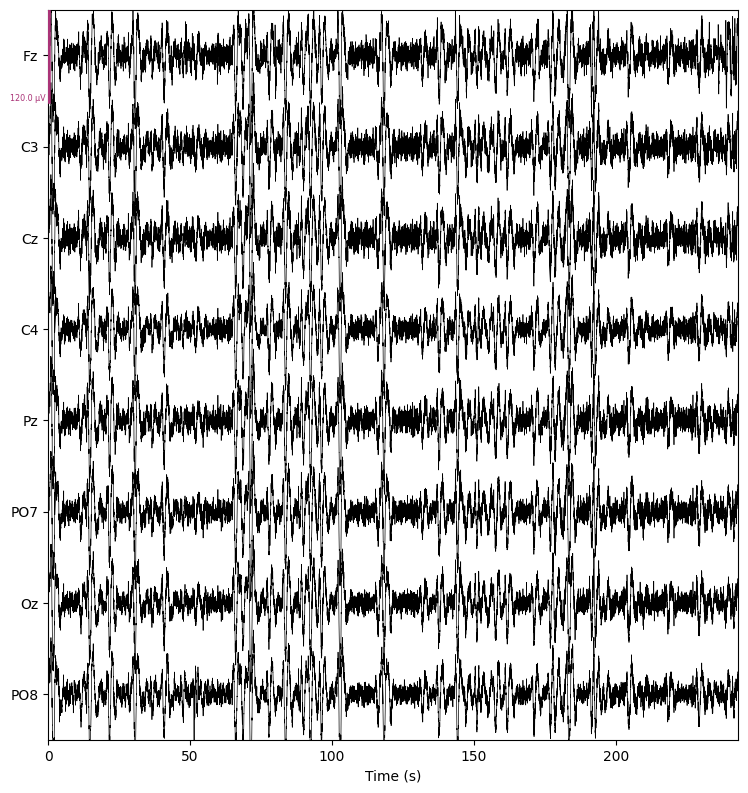

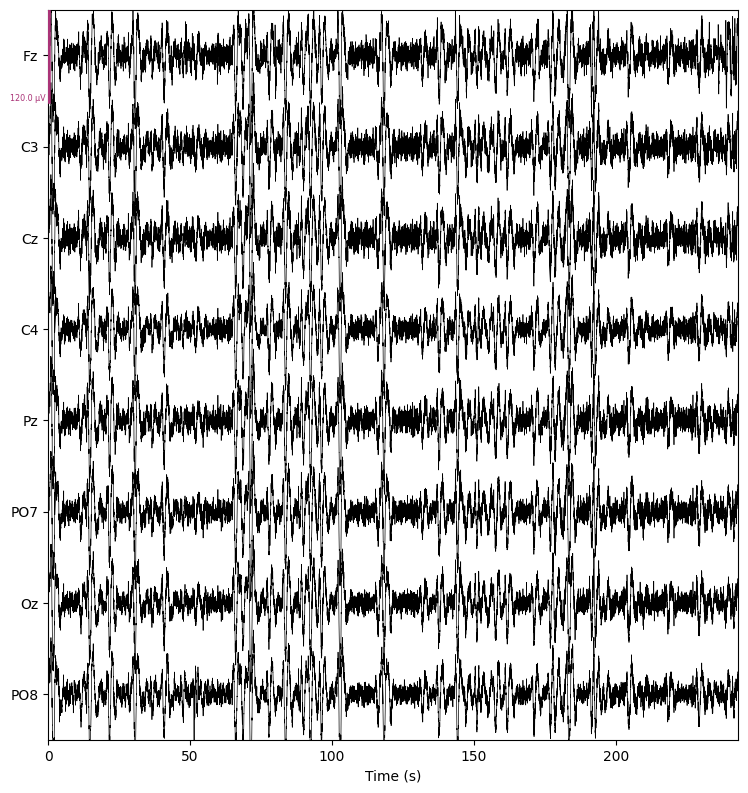

In [58]:
thisRec = RawArray(eeg.T/1e6, create_info(chs, fs, ch_types='eeg'))

# Get event indexes where value is not 0, i.e. -1 or 1
pos = np.where(trigger != 0)[0]

print(len(trigger))
# Filter 0 values from the trigger array
y = trigger[trigger != 0]
print(pos, len(pos), y, len(y))

# Create the stimuli channel
stim_data = np.zeros((1, thisRec.n_times))

# MNE works with absolute values of labels so -1 and +1 would result in only one kind of event
# that's why we add 2 and obtain 1 and 3 as label values
stim_data[0,pos] = y + 2
ones = stim_data[stim_data == 1]
threes = stim_data[stim_data == 3]
print("Ones", ones, len(ones))
print("Threes", threes, len(threes))
print('stim_data = ', stim_data)
stim_raw = RawArray(stim_data, create_info(['STI'], thisRec.info['sfreq'], ch_types=['stim']))
print('stim_raw = ', stim_raw)
# adding the stimuli channel (as a Raw object) to our EEG Raw object
thisRec.add_channels([stim_raw])

# Set the standard 10-20 montage
montage = make_standard_montage('standard_1020')
thisRec.set_montage(montage)

thisRec.plot(n_channels = len(unicorn_channels), show_scrollbars = False, duration = 400, scalings = 60e-6)

**Fittiamo ICA su tutto il segnale raw filtrato, e con epoche di 1s**

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 825 samples (3.300 s)

Not setting metadata
243 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 243 events and 251 original time points ...
0 bad epochs dropped
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished


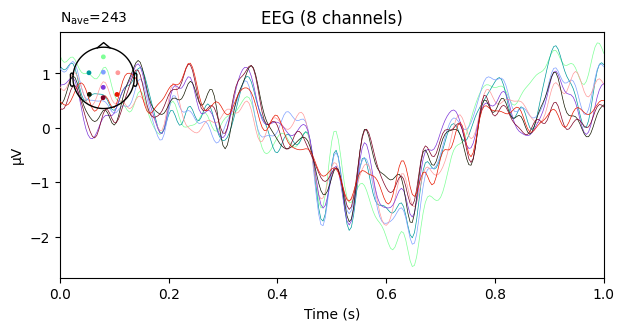

In [59]:
# Preprocessing with ICA

low_cut = 1.0
hi_cut  = 30

filt_raw = thisRec.copy().filter(l_freq = low_cut, h_freq = hi_cut)

t_a = 0
t_b = 1

d = t_b - t_a

events_ica = mne.make_fixed_length_events(filt_raw, duration = d)
epochs_ica = mne.Epochs(filt_raw, events_ica, tmin = t_a, tmax = t_b, baseline = None, preload = True)


epochs_ica.average().plot(spatial_colors = True);

In [60]:


reject = get_rejection_threshold(epochs_ica)
epochs_ica = epochs_ica.drop_bad(reject)
reject

Estimating rejection dictionary for eeg
    Rejecting  epoch based on EEG : ['Fz', 'C3', 'Cz', 'C4', 'Pz', 'PO7', 'Oz', 'PO8']
    Rejecting  epoch based on EEG : ['Fz', 'C3', 'Cz', 'C4', 'Pz', 'PO7', 'Oz', 'PO8']
    Rejecting  epoch based on EEG : ['Fz', 'C3', 'Cz', 'C4', 'Pz', 'PO7', 'Oz', 'PO8']
    Rejecting  epoch based on EEG : ['PO8']
    Rejecting  epoch based on EEG : ['Fz', 'C3', 'Cz', 'C4', 'Pz', 'PO7', 'Oz', 'PO8']
    Rejecting  epoch based on EEG : ['Fz', 'C3', 'Cz', 'C4', 'Pz', 'PO7', 'Oz', 'PO8']
    Rejecting  epoch based on EEG : ['Fz', 'C3', 'Cz', 'C4', 'Pz', 'PO7', 'Oz']
    Rejecting  epoch based on EEG : ['C3', 'Cz', 'C4', 'Pz']
    Rejecting  epoch based on EEG : ['Fz', 'C3', 'Cz', 'C4', 'Pz', 'PO7', 'Oz', 'PO8']
    Rejecting  epoch based on EEG : ['Fz', 'C3', 'Cz', 'C4', 'Pz', 'Oz']
    Rejecting  epoch based on EEG : ['Fz', 'C3', 'Cz', 'C4', 'Pz', 'PO7', 'Oz', 'PO8']
    Rejecting  epoch based on EEG : ['Fz', 'C3', 'Cz', 'C4', 'Pz', 'PO7', 'Oz', 'PO8']
    Re

{'eeg': 5.007817702977329e-05}

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Selecting by explained variance: 6 components


<ipython-input-61-a7f86c201b7e>:4: RuntimeWarning: The following parameters passed to ICA.fit() will be ignored, as they only affect raw data (and it appears you passed epochs): reject
  ica.fit(epochs_ica, reject = reject, tstep = d)


Fitting ICA took 0.4s.
Creating RawArray with float64 data, n_channels=6, n_times=60782
    Range : 0 ... 60781 =      0.000 ...   243.124 secs
Ready.


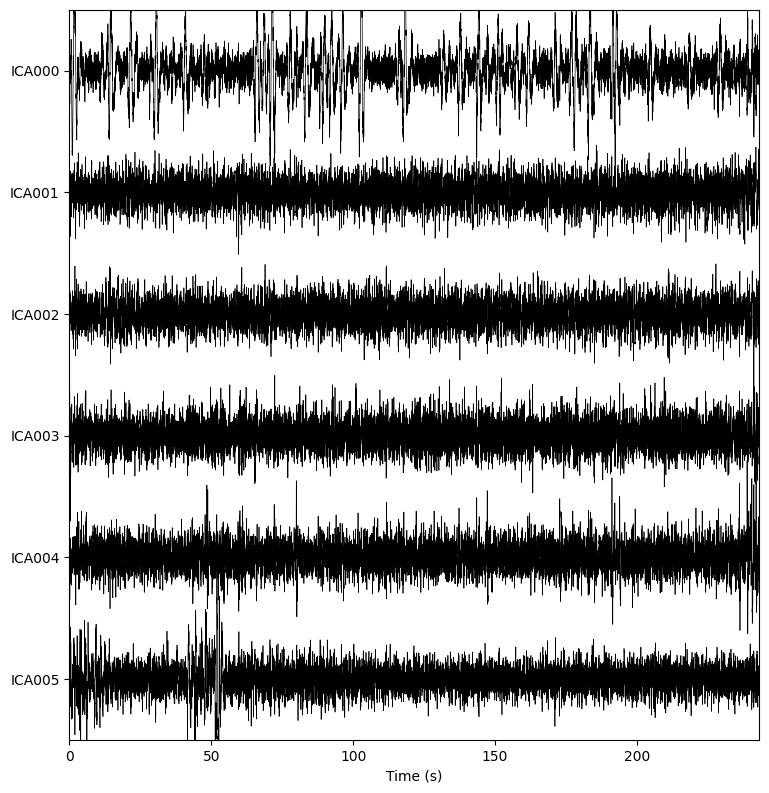

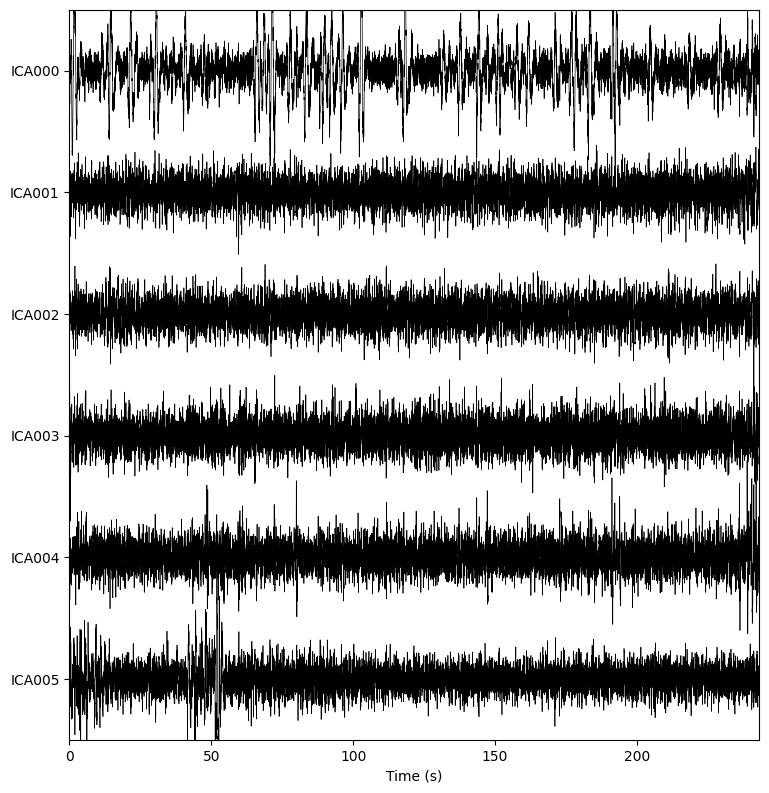

In [61]:
n_components = 0.99

ica = mne.preprocessing.ICA(n_components = n_components, max_iter = 'auto', random_state = 0)
ica.fit(epochs_ica, reject = reject, tstep = d)
ica.plot_sources(filt_raw, show_scrollbars = False, stop = 400)

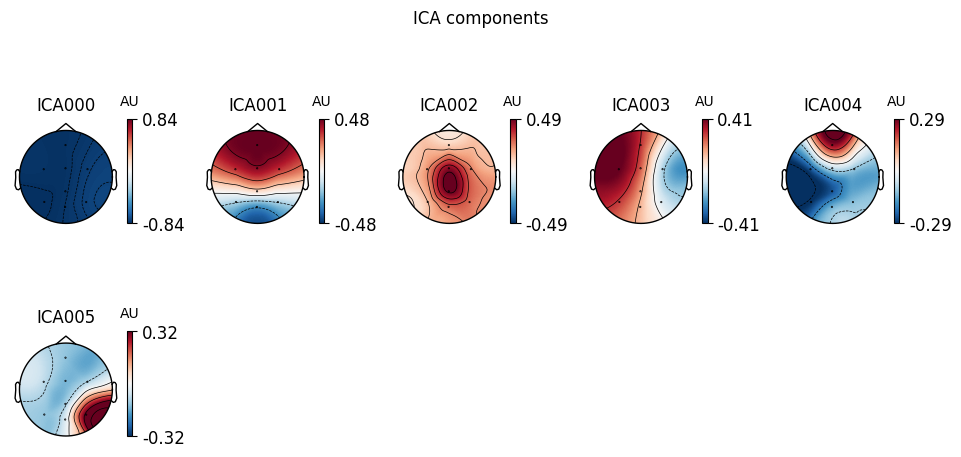

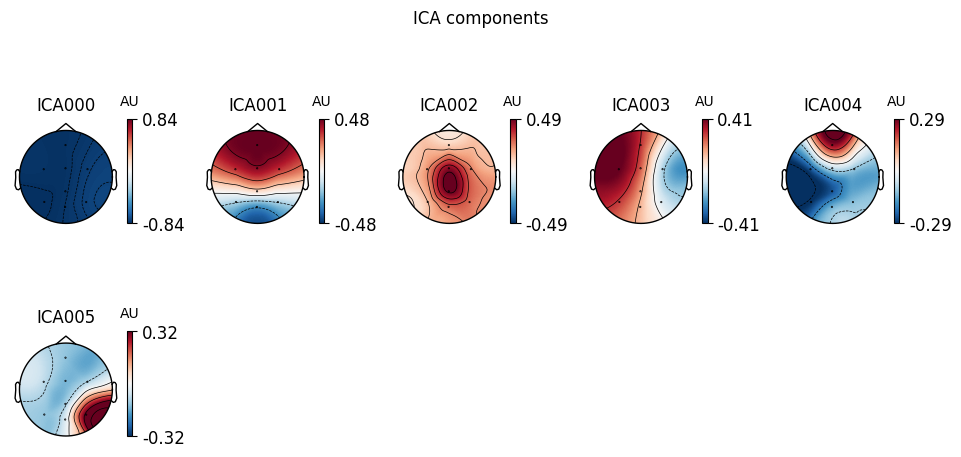

In [62]:
ica.plot_components(colorbar = True)

Using EOG channel: Fz
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2500 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- F

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


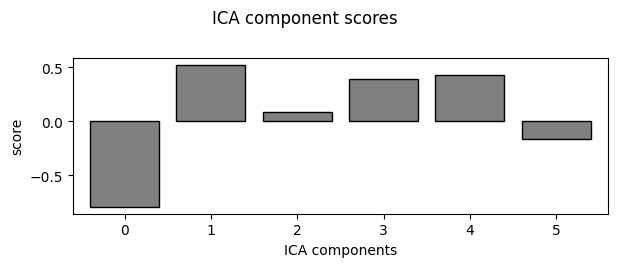

In [63]:
ica_z_thresh = 1.96
eog_indices, eog_scores = ica.find_bads_eog(filt_raw, ch_name = ['Fz'], threshold = ica_z_thresh)
ica.exclude = eog_indices

ica.plot_scores(eog_scores);

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 825 samples (3.300 s)

1200 events found
Event IDs: [1 3]


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s finished


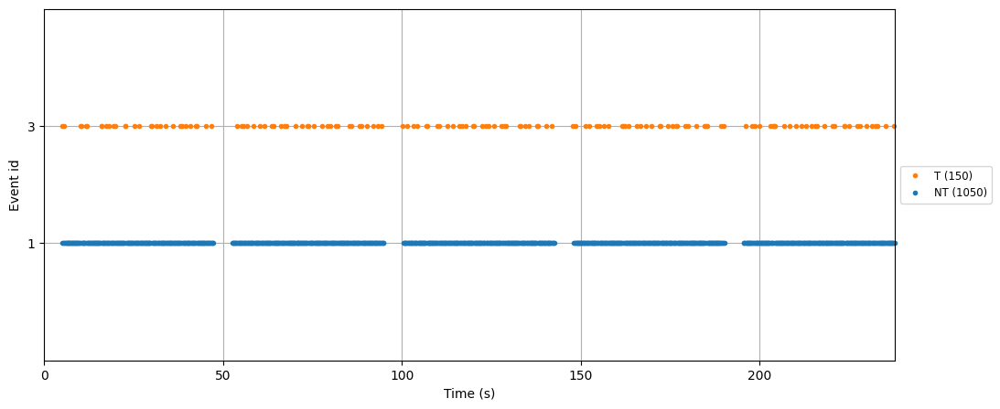

In [64]:
raw = thisRec.copy().filter(l_freq = ica_low_cut, h_freq = hi_cut)

events = mne.find_events(raw, stim_channel = 'STI')
ev_ids = {'NT': 1, 'T': 3}

fig, ax = plt.subplots(figsize = [15, 5])

mne.viz.plot_events(events, raw.info['sfreq'], event_id = ev_ids, axes = ax)
plt.show()

Not setting metadata
1200 matching events found
Setting baseline interval to [-0.6, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 1200 events and 351 original time points ...
0 bad epochs dropped
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


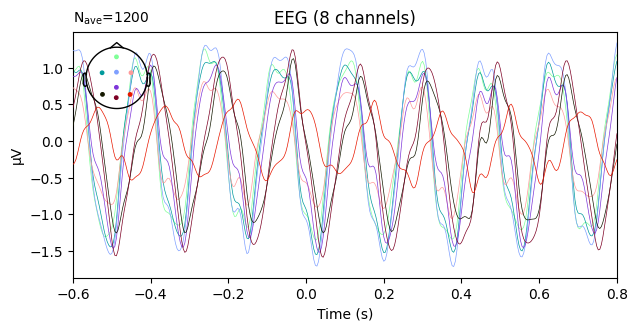

In [65]:
t_a = -.6
t_b = .8

eps = mne.Epochs(raw, events, event_id = ev_ids, tmin = t_a, tmax = t_b, baseline = (None, 0), preload = True)

eps.average().plot(spatial_colors = True, picks = 'eeg');

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


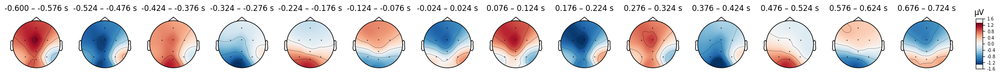

In [66]:
times = np.arange(t_a, t_b, 0.1)

eps.average().plot_topomap(times = times, average = 0.050);

In [67]:
epochs_postica = ica.apply(eps.copy())

Applying ICA to Epochs instance
    Transforming to ICA space (6 components)
    Zeroing out 0 ICA components
    Projecting back using 8 PCA components


<ipython-input-67-6b8f860419f0>:1: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  epochs_postica = ica.apply(eps.copy())


In [68]:
reject = get_rejection_threshold(epochs_postica)
epochs_postica = epochs_postica.drop_bad(reject)
reject

Estimating rejection dictionary for eeg
0 bad epochs dropped


{'eeg': 0.00013293641726973705}

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


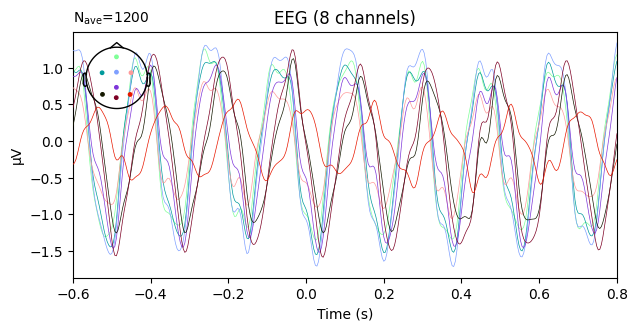

In [69]:
epochs_postica.average().plot(spatial_colors = True);

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


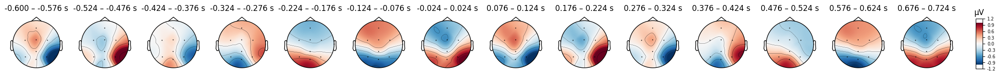

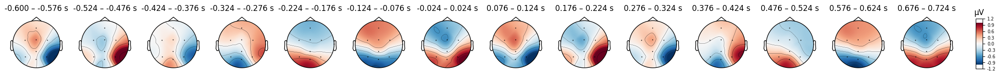

In [70]:
epochs_avgref = epochs_postica.set_eeg_reference(ref_channels = 'average')
epochs_avgref.average().plot_topomap(times = times, average = .050)

In [71]:
df = epochs_avgref.to_data_frame()
print(type(epochs_avgref))
df.tail()

<class 'mne.epochs.Epochs'>


,time,condition,epoch,Fz,C3,Cz,C4,Pz,PO7,Oz,PO8,STI
421195,0.784,NT,1199,0.178761,1.854273,2.643434,-3.054837,1.319214,0.706007,-1.171174,-2.475677,0.0
421196,0.788,NT,1199,2.257639,2.839868,2.969767,-1.885361,0.475786,-0.049906,-2.584820,-4.022973,0.0
421197,0.792,NT,1199,4.411321,3.403020,3.066649,-0.784435,-0.691081,-0.875611,-3.777268,-4.752595,0.0
421198,0.796,NT,1199,6.508890,3.523472,3.082965,0.163653,-2.051702,-1.857812,-4.779080,-4.590386,0.0
421199,0.800,NT,1199,8.485966,3.318035,3.178104,0.999948,-3.419509,-3.053359,-5.701272,-3.807913,0.0


In [72]:
df.drop(['STI', 'time'], axis = 1, inplace = True)

df = df.groupby(["epoch", "condition"], as_index = False).agg(
    Fz = ("Fz", pd.Series.to_list),
    C3 = ("C3", pd.Series.to_list),
    Cz = ("Cz", pd.Series.to_list),
    C4 = ("C4", pd.Series.to_list),
    Pz = ("Pz", pd.Series.to_list),
    PO7 = ("PO7", pd.Series.to_list),
    Oz = ("Oz", pd.Series.to_list),
    PO8 = ("PO8", pd.Series.to_list),
)

df.condition[df.condition == 'NT'] = 0
df.condition[df.condition == 'T'] = 1

df.head()

<ipython-input-72-c742a9f02f2f>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.condition[df.condition == 'NT'] = 0
<ipython-input-72-c742a9f02f2f>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.condition[df.condition == 'T'] = 1


,epoch,condition,Fz,C3,Cz,C4,Pz,PO7,Oz,PO8
0,0,0,"[1.924956504190125, 0.09497388940362685, -0.94...","[-1.8775547080672392, -1.7177038463272065, -1....","[-2.484962284904699, -3.2770824520351822, -3.7...","[0.48797090493942197, 1.2640916663678405, 1.85...","[-3.585547540955881, -2.691180620223295, -1.88...","[0.5537893364830992, 0.6113947580440716, 0.359...","[-0.20450389311076306, 0.39238768671066854, 0....","[5.1858516814259445, 5.3231189180594916, 5.056..."
1,1,1,"[-2.8460998694424133, -1.9835247262994138, -1....","[2.8247604499280907, 3.389583891599823, 3.1428...","[-1.8569242185275525, -2.102912351839815, -2.0...","[-2.04782998407741, -2.47338220753213, -2.0015...","[2.457942256598756, 2.0192397153995447, 1.6497...","[2.760842052958205, 4.112199272570165, 4.33866...","[-0.8538244146220487, -1.258123724949454, -1.7...","[-0.43886627281562857, -1.7030798689487212, -2..."
2,2,0,"[2.549181000713247, 3.5200899271006154, 3.9312...","[1.1283034608336626, 1.6621317511479303, 2.017...","[-0.44438673526552724, -0.05947727437674031, 0...","[4.822067148240217, 4.747104928217363, 4.22725...","[-2.0675218135683036, -2.1981588391907, -2.006...","[-2.8399958778874526, -2.629808469443271, -2.3...","[-3.856457093929829, -3.9811147087629957, -3.8...","[0.7088099108639834, -1.060767314692197, -2.38..."
3,3,0,"[5.365174335927841, 6.981285999331091, 8.17641...","[-0.03647982772911175, -1.0064007473391814, -2...","[1.3171461470504546, 1.7972088586941934, 1.847...","[2.0051131604553896, 1.7986790242064528, 1.449...","[0.07414792740179321, -0.24441571884191368, -0...","[-4.070285424780753, -4.551880081942145, -4.50...","[-1.0087098762702502, -0.8014223186309527, -0....","[-3.646106442055367, -3.973055015477548, -4.22..."
4,4,1,"[-5.0270923442220035, -5.695965862804026, -5.8...","[-7.127967288802246, -7.152868627448278, -6.12...","[-1.0397905144473234, -1.0775570749369332, -0....","[-0.9489855503808959, -0.7391041062822713, -0....","[2.4498595963724594, 2.1338872395258353, 1.792...","[2.1085294612583945, 2.2888127265355513, 2.382...","[6.7005018593351116, 6.87962153230521, 6.23793...","[2.8849447808865016, 3.363174173104916, 2.8438..."


In [73]:
file_path = os.path.join(path_mount, path_data, "Preprocessed/", subject)
df.to_json(file_path + "_eeg.json")
print(file_path + "_eeg.json")

/content/drive/MyDrive/Colab Notebooks/data/DataMiningProject/Preprocessed/S4_eeg.json


# **ICA per il paziente S5**

In [74]:
subject = "S5"
file_path = os.path.join(path_mount, path_data, subject)
df = pd.read_json(file_path + ".json")

trigger = np.array(df.trigger)

eeg = df[unicorn_channels].to_numpy()
chs = unicorn_channels
fs = df['sampling_rate'].values[0]

df[df['trigger'] == 1]
df.head()

,Fz,C3,Cz,C4,Pz,PO7,Oz,PO8,trigger,sampling_rate
0,-7.306136,1.331568,-10.838615,6.521477,-8.872972,-4.274060,1.300171,6.118326,0,250
1,-8.485439,1.736353,-7.951815,6.537561,-7.054497,-1.675333,2.468046,7.073197,0,250
2,-9.703192,1.606679,-4.401137,5.987935,-5.172068,3.087872,3.561907,7.760333,0,250
3,-11.232047,0.603105,-1.415161,4.966339,-3.939235,9.502599,4.329813,7.962170,0,250
4,-13.209923,-1.045084,0.414185,4.088173,-3.611395,16.661240,4.462581,7.581654,0,250


Creating RawArray with float64 data, n_channels=8, n_times=60855
    Range : 0 ... 60854 =      0.000 ...   243.416 secs
Ready.
60855
[ 1247  1294  1338 ... 59431 59482 59522] 1200 [-1 -1 -1 ... -1  1 -1] 1200
Ones [1. 1. 1. ... 1. 1. 1.] 1050
Threes [3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3.] 150
stim_data =  [[0. 0. 0. ... 0. 0. 0.]]
Creating RawArray with float64 data, n_channels=1, n_times=60855
    Range : 0 ... 60854 =      0.000 ...   243.416 secs
Ready.
stim_raw =  <RawArray | 1 x 60855 (243.4 s), ~482 kB, data loaded>


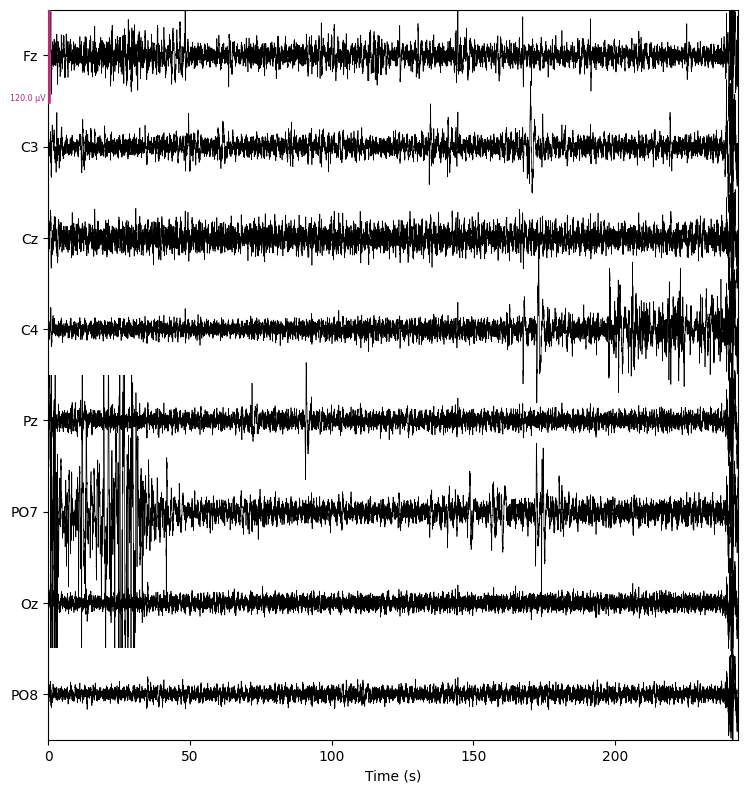

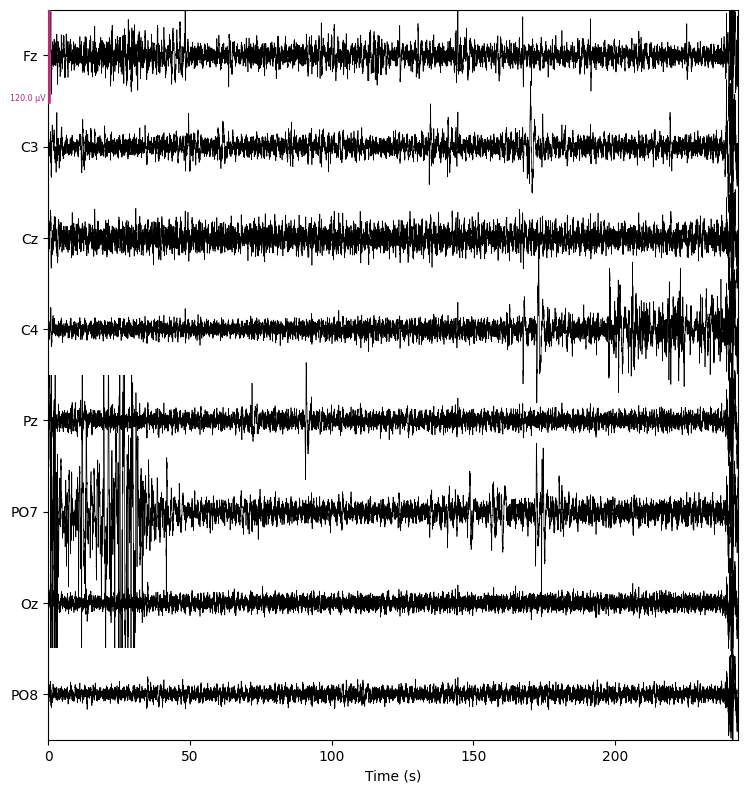

In [75]:
thisRec = RawArray(eeg.T/1e6, create_info(chs, fs, ch_types='eeg'))

# Get event indexes where value is not 0, i.e. -1 or 1
pos = np.where(trigger != 0)[0]

print(len(trigger))
# Filter 0 values from the trigger array
y = trigger[trigger != 0]
print(pos, len(pos), y, len(y))

# Create the stimuli channel
stim_data = np.zeros((1, thisRec.n_times))

# MNE works with absolute values of labels so -1 and +1 would result in only one kind of event
# that's why we add 2 and obtain 1 and 3 as label values
stim_data[0, pos] = y + 2
ones = stim_data[stim_data == 1]
threes = stim_data[stim_data == 3]
print("Ones", ones, len(ones))
print("Threes", threes, len(threes))
print('stim_data = ', stim_data)
stim_raw = RawArray(stim_data, create_info(['STI'], thisRec.info['sfreq'], ch_types = ['stim']))
print('stim_raw = ', stim_raw)
# adding the stimuli channel (as a Raw object) to our EEG Raw object
thisRec.add_channels([stim_raw])

# Set the standard 10-20 montage
montage = make_standard_montage('standard_1020')
thisRec.set_montage(montage)

thisRec.plot(n_channels = len(unicorn_channels), show_scrollbars = False, duration = 400, scalings = 60e-6)

**Fittiamo ICA su tutto il segnale raw filtrato, e con epoche di 1s**

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 825 samples (3.300 s)

Not setting metadata
243 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 243 events and 251 original time points ...
0 bad epochs dropped
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished


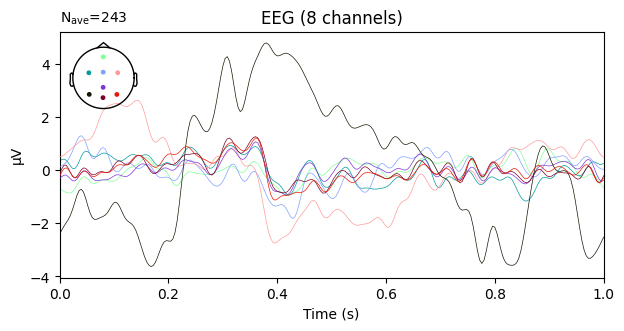

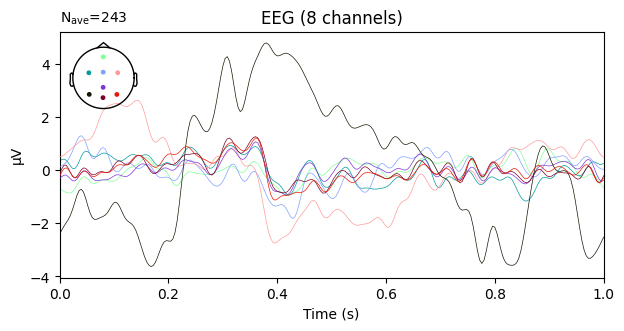

In [76]:
# Preprocessing with ICA

low_cut = 1.0
hi_cut  = 30

filt_raw = thisRec.copy().filter(l_freq = low_cut, h_freq = hi_cut)

t_a = 0
t_b = 1

d = t_b - t_a

events_ica = mne.make_fixed_length_events(filt_raw, duration = d)
epochs_ica = mne.Epochs(filt_raw, events_ica, tmin = t_a, tmax = t_b, baseline = None, preload = True)

epochs_ica.average().plot(spatial_colors = True)

In [77]:


reject = get_rejection_threshold(epochs_ica)
epochs_ica = epochs_ica.drop_bad(reject)
reject

Estimating rejection dictionary for eeg
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : 

{'eeg': 0.00010494810808923147}

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Selecting by explained variance: 7 components
Fitting ICA took 0.3s.
Creating RawArray with float64 data, n_channels=7, n_times=60855
    Range : 0 ... 60854 =      0.000 ...   243.416 secs
Ready.


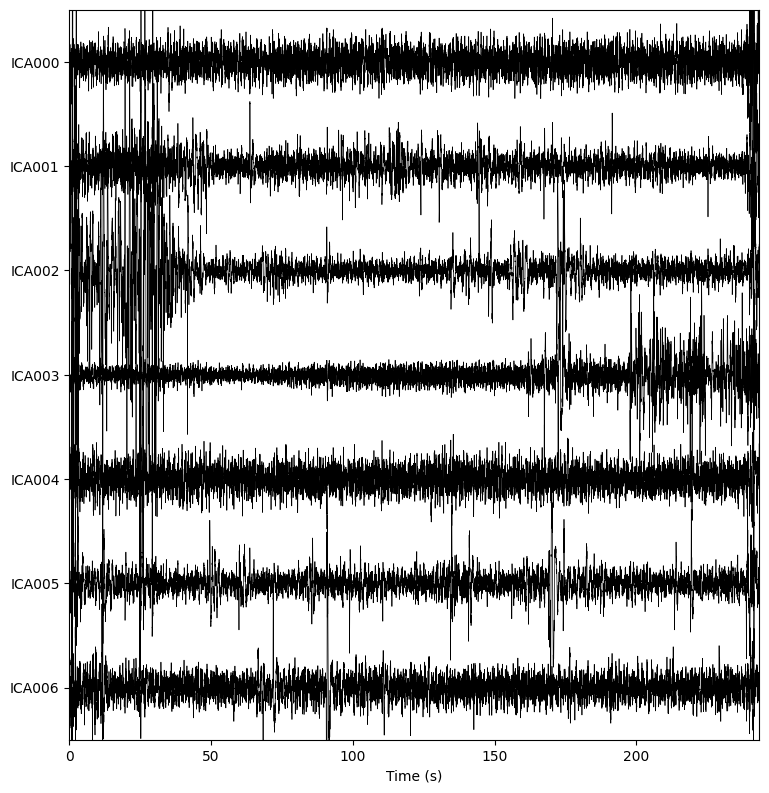

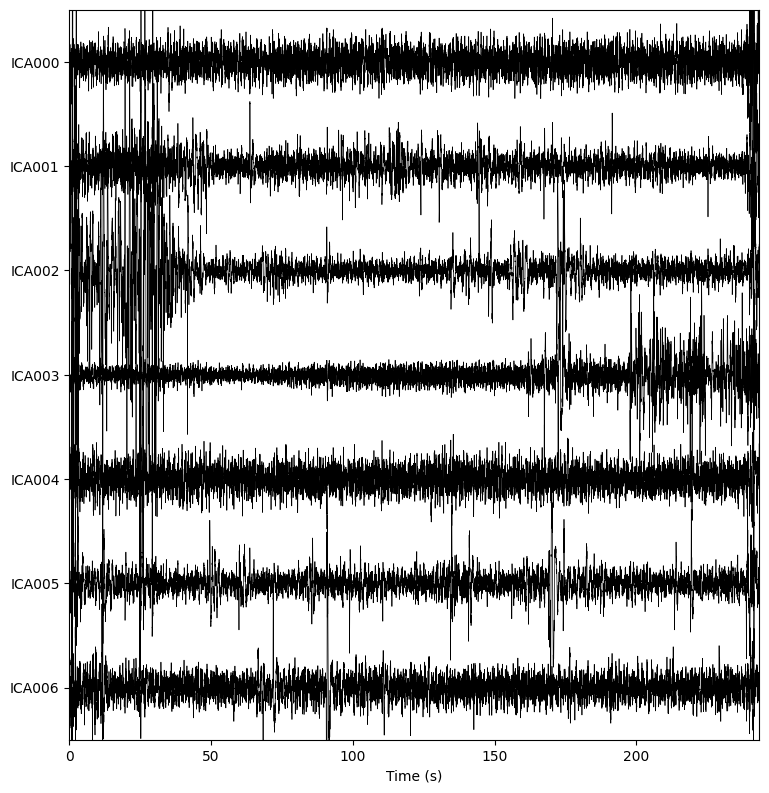

In [78]:
n_components = 0.99

ica = mne.preprocessing.ICA(n_components = n_components, max_iter = 'auto', random_state = 0)
ica.fit(epochs_ica, tstep = d)
ica.plot_sources(filt_raw, show_scrollbars = False, stop = 400)

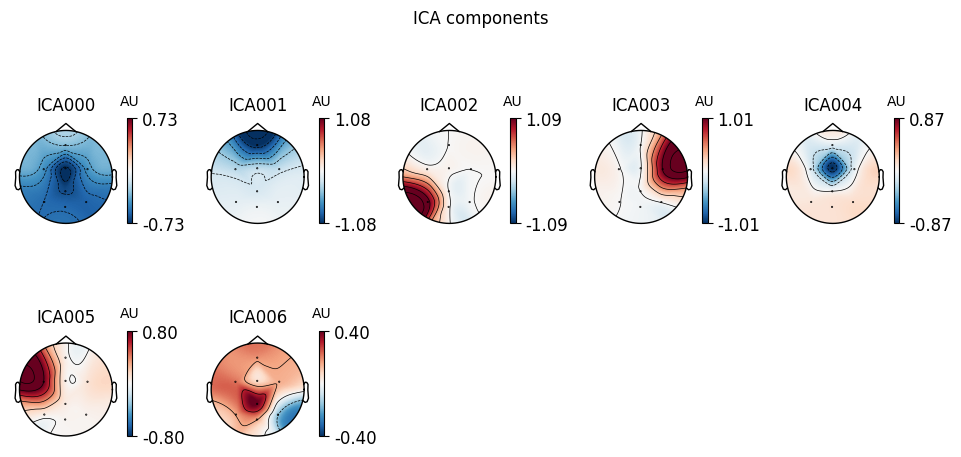

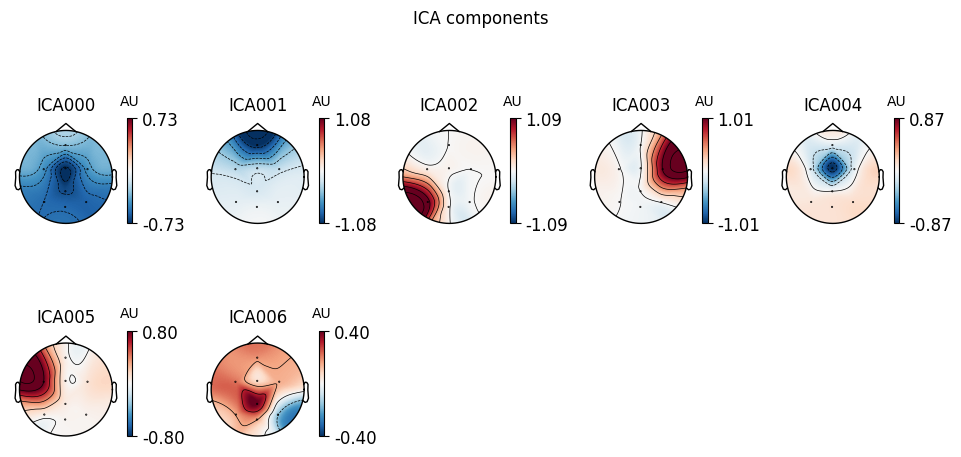

In [79]:
ica.plot_components(colorbar = True)

Using EOG channel: Fz
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2500 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- F

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


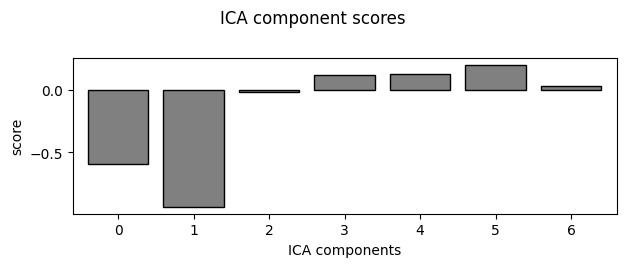

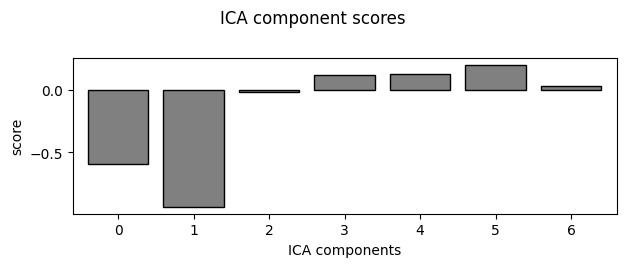

In [80]:
ica_z_thresh = 1.96
eog_indices, eog_scores = ica.find_bads_eog(filt_raw, ch_name = ['Fz'], threshold = ica_z_thresh)
ica.exclude = eog_indices

ica.plot_scores(eog_scores)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 825 samples (3.300 s)

1200 events found
Event IDs: [1 3]


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished


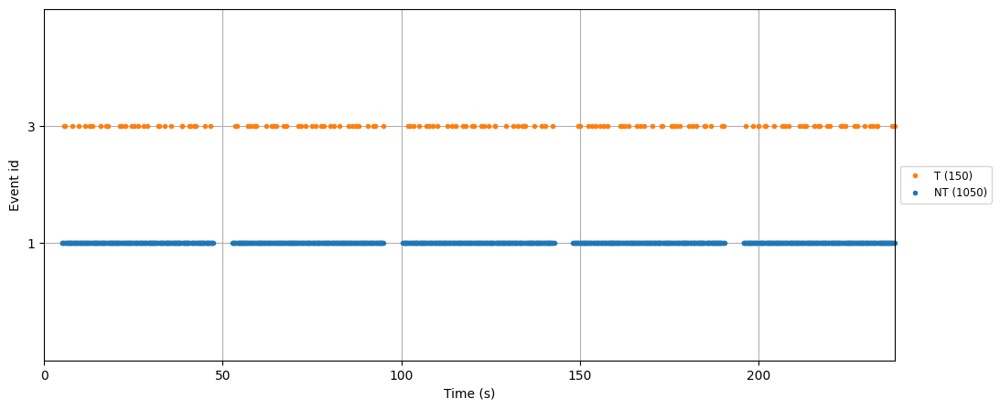

In [81]:
raw = thisRec.copy().filter(l_freq = ica_low_cut, h_freq = hi_cut)

events = mne.find_events(raw, stim_channel = 'STI')
ev_ids = {'NT': 1, 'T': 3}

fig, ax = plt.subplots(figsize = [15, 5])

mne.viz.plot_events(events, raw.info['sfreq'], event_id = ev_ids, axes = ax)
plt.show()

Not setting metadata
1200 matching events found
Setting baseline interval to [-0.6, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 1200 events and 351 original time points ...
0 bad epochs dropped
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


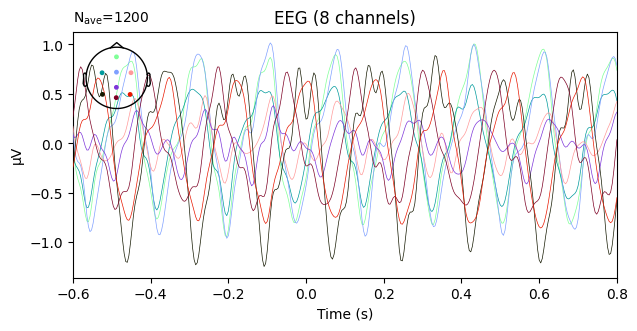

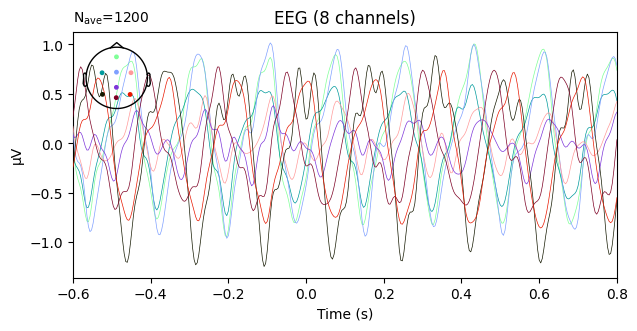

In [82]:
t_a = -.6
t_b = .8

eps = mne.Epochs(raw, events, event_id = ev_ids, tmin = t_a, tmax = t_b, baseline = (None, 0), preload = True)

eps.average().plot(spatial_colors = True, picks = 'eeg')

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


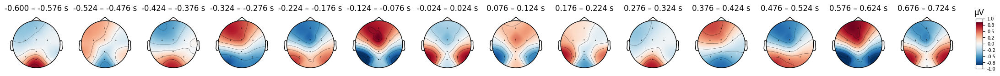

In [83]:
times = np.arange(t_a, t_b, 0.1)

eps.average().plot_topomap(times = times, average = 0.050);

In [84]:
epochs_postica = ica.apply(eps.copy())

Applying ICA to Epochs instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 8 PCA components


<ipython-input-84-6b8f860419f0>:1: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  epochs_postica = ica.apply(eps.copy())


In [85]:
reject = get_rejection_threshold(epochs_postica)
epochs_postica = epochs_postica.drop_bad(reject)
reject

Estimating rejection dictionary for eeg
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : ['PO7']
    Rejecting  epoch based on EEG : 

{'eeg': 0.00022390333804148723}

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


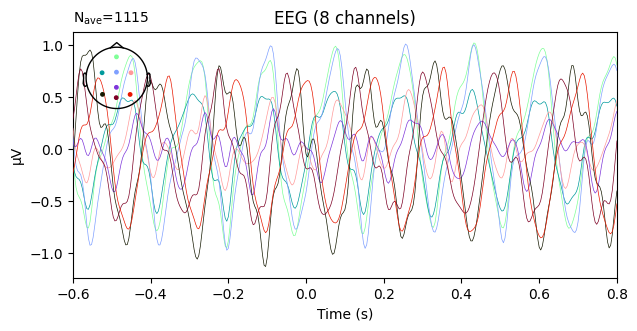

In [86]:
epochs_postica.average().plot(spatial_colors = True);

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


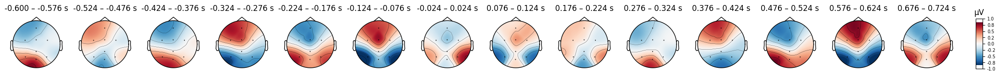

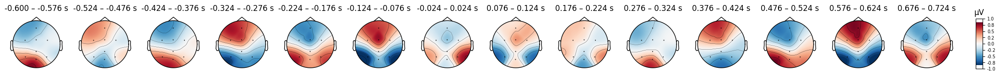

In [87]:
epochs_avgref = epochs_postica.set_eeg_reference(ref_channels = 'average')
epochs_avgref.average().plot_topomap(times = times, average = .050)

In [88]:
df = epochs_avgref.to_data_frame()
df.head()

,time,condition,epoch,Fz,C3,Cz,C4,Pz,PO7,Oz,PO8,STI
0,-0.600,NT,0,-7.913721,-16.641791,-1.751090,1.571450,1.957795,13.058779,2.843766,6.874811,0.0
1,-0.596,NT,0,-6.711565,-16.539540,-1.971154,1.893636,1.610208,13.301149,1.785914,6.631351,0.0
2,-0.592,NT,0,-5.182517,-16.325973,-1.841032,2.694079,1.498672,12.433017,0.588816,6.134938,0.0
3,-0.588,NT,0,-3.421200,-15.967285,-1.610850,3.703650,1.499494,10.869996,-0.568254,5.494448,0.0
4,-0.584,NT,0,-1.479008,-15.294613,-1.608892,4.705882,1.436921,8.957468,-1.597712,4.879954,0.0


In [89]:
df.drop(['STI', 'time'], axis = 1, inplace = True)

df = df.groupby(["epoch", "condition"], as_index = False).agg(
    Fz = ("Fz", pd.Series.to_list),
    C3 = ("C3", pd.Series.to_list),
    Cz = ("Cz", pd.Series.to_list),
    C4 = ("C4", pd.Series.to_list),
    Pz = ("Pz", pd.Series.to_list),
    PO7 = ("PO7", pd.Series.to_list),
    Oz = ("Oz", pd.Series.to_list),
    PO8 = ("PO8", pd.Series.to_list),
)

df.condition[df.condition == 'NT'] = 0
df.condition[df.condition == 'T'] = 1

df.head()

<ipython-input-89-c742a9f02f2f>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.condition[df.condition == 'NT'] = 0
<ipython-input-89-c742a9f02f2f>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.condition[df.condition == 'T'] = 1


,epoch,condition,Fz,C3,Cz,C4,Pz,PO7,Oz,PO8
0,0,0,"[-7.913720704818851, -6.711564601706954, -5.18...","[-16.641790600450054, -16.539539960423962, -16...","[-1.7510903839456307, -1.9711542184149144, -1....","[1.5714504807935734, 1.8936361467647178, 2.694...","[1.9577952062148667, 1.6102082850483053, 1.498...","[13.058779451911244, 13.301148596769785, 12.43...","[2.843765820776259, 1.7859143003958362, 0.5888...","[6.87481072951859, 6.631351451567189, 6.134937..."
1,1,0,"[-6.5381892613476635, -6.176774034841604, -5.6...","[-10.998826762370483, -10.57578509365831, -9.8...","[10.969848688579374, 10.665728401109611, 10.04...","[-2.7210203088664615, -2.483097309346913, -2.1...","[-6.67969873561778, -6.438637863912744, -6.581...","[32.40955203723182, 32.120155818892286, 32.065...","[-8.622124317686774, -9.126161162760578, -9.51...","[-7.81954133992203, -7.98542875548175, -8.3744..."
2,2,0,"[2.3008548088984018, 3.052449458928101, 3.3002...","[6.120471875722276, 5.85518793851307, 5.694182...","[0.7679714593689786, 2.489390447453311, 3.2014...","[0.11354003803756382, 0.1827539230969946, 0.26...","[-5.493510743795357, -6.3341241567487305, -6.9...","[5.376740694520205, 4.338321049515487, 3.77449...","[-3.957519145570531, -4.477744074478495, -4.47...","[-5.228548987181549, -5.106234586279739, -4.82..."
3,3,0,"[-6.512364508919896, -6.449506851991681, -6.60...","[7.6622295830875045, 7.8892195255090565, 7.851...","[-13.894362849443935, -13.03606026817582, -11....","[2.876117453635884, 3.033844113332249, 3.35950...","[2.3561522543256586, 2.663417586221415, 2.5850...","[4.469977887682717, 2.483611909949882, 0.57553...","[3.5411632599051046, 3.4534209197517645, 3.476...","[-0.49891308027303516, -0.03794693459686377, 0..."
4,4,1,"[-5.279068892201943, -4.517504704799249, -3.27...","[9.212494121360635, 9.427374047618054, 9.62569...","[-1.3519874158835685, -0.09756639729353386, 1....","[-2.1312577915519006, -0.6186457744753368, 0.5...","[2.407097075570497, 2.2575817957590876, 2.4005...","[-8.028240805196328, -10.196798495970363, -12....","[4.463038376736189, 3.2816580634657635, 1.9442...","[0.7079253311664209, 0.463901465695578, 0.0702..."


In [90]:
file_path = os.path.join(path_mount, path_data, 'Preprocessed', subject)
df.to_json(file_path + "_eeg.json")
print(file_path + "_eeg.json")

/content/drive/MyDrive/Colab Notebooks/data/DataMiningProject/Preprocessed/S5_eeg.json
